In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T
from torchvision.models import convnext_tiny
from PIL import Image
import numpy as np
import cv2
from glob import glob

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)

class Down(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(Down, self).__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.maxpool_conv(x)

class Up(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(Up, self).__init__()
        self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]
        x1 = F.pad(x1, (diffX // 2, diffX - diffX // 2, diffY // 2, diffY - diffY // 2))
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)

class AttentionBlock(nn.Module):
    def __init__(self, F_g, F_l, F_int):
        super(AttentionBlock, self).__init__()
        self.W_g = nn.Sequential(
            nn.Conv2d(F_g, F_int, kernel_size=1),
            nn.BatchNorm2d(F_int)
        )
        self.W_x = nn.Sequential(
            nn.Conv2d(F_l, F_int, kernel_size=1),
            nn.BatchNorm2d(F_int)
        )
        self.psi = nn.Sequential(
            nn.Conv2d(F_int, 1, kernel_size=1),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )
        self.relu = nn.ReLU(inplace=True)

    def forward(self, g, x):
        if g.shape[2:] != x.shape[2:]:
            g = F.interpolate(g, size=x.shape[2:], mode='bilinear', align_corners=True)
        g1 = self.W_g(g)
        x1 = self.W_x(x)
        psi = self.relu(g1 + x1)
        psi = self.psi(psi)
        return x * psi

class ProtoUNet(nn.Module):
    def __init__(self, n_channels=3, n_classes=1, num_prototypes=5):
        super(ProtoUNet, self).__init__()
        self.num_prototypes = num_prototypes
        self.features = [64, 128, 256, 512]

        # Encoder
        self.inc = DoubleConv(n_channels, self.features[0])
        self.down1 = Down(self.features[0], self.features[1])
        self.down2 = Down(self.features[1], self.features[2])
        self.down3 = Down(self.features[2], self.features[3])
        self.bottleneck = DoubleConv(self.features[3], self.features[3])

        # Attention
        self.att3 = AttentionBlock(self.features[3], self.features[2], self.features[1])
        self.att2 = AttentionBlock(self.features[2], self.features[1], self.features[0])
        self.att1 = AttentionBlock(self.features[1], self.features[0], self.features[0] // 2)

        # Decoder
        self.up3 = Up(self.features[3] + self.features[2], self.features[2])
        self.up2 = Up(self.features[2] + self.features[1], self.features[1])
        self.up1 = Up(self.features[1] + self.features[0], self.features[0])
        self.outc = nn.Conv2d(self.features[0], n_classes, kernel_size=1)

        # Prototype layers
        self.proto_layers = nn.ModuleList([
            nn.ModuleList([nn.Conv2d(feat, feat, kernel_size=1) for _ in range(num_prototypes)])
            for feat in self.features
        ])

    def forward_encoder(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x4 = self.bottleneck(x4)
        return [x1, x2, x3, x4]

    def compute_prototypes(self, features, mask):
        all_protos = []
        for lvl, feat in enumerate(features):
            lvl_protos = []
            msk_resized = F.interpolate(mask, size=feat.shape[2:], mode='nearest')
            for p in range(self.num_prototypes):
                if p == 0:
                    proto_mask = msk_resized
                elif p in [1, 2]:
                    kernel = torch.ones(3, 3, device=mask.device)
                    padded = F.pad(msk_resized, (1, 1, 1, 1))
                    conv = F.conv2d(padded, kernel.view(1, 1, 3, 3))
                    if p == 1:
                        proto_mask = ((conv == 1) & (msk_resized == 1)).float()
                    else:
                        proto_mask = ((conv >= 3) & (msk_resized == 1)).float()
                elif p == 3:
                    eroded = F.max_pool2d(msk_resized, 3, 1, padding=1) < 1
                    dilated = F.max_pool2d(-msk_resized + 1, 3, 1, padding=1) < 1
                    proto_mask = (dilated & ~eroded).float()
                else:
                    kernel = torch.ones(5, 5, device=mask.device)
                    padded = F.pad(msk_resized, (2, 2, 2, 2))
                    thick = F.conv2d(padded, kernel.view(1, 1, 5, 5)) >= 15
                    proto_mask = (thick.float() * msk_resized)
                masked = feat * proto_mask
                sum_mask = proto_mask.sum(dim=(2, 3), keepdim=True) + 1e-8
                proto = masked.sum(dim=(2, 3), keepdim=True) / sum_mask
                proto = self.proto_layers[lvl][p](proto)
                lvl_protos.append(proto)
            all_protos.append(lvl_protos)
        return all_protos

    def decode(self, feats):
        x1, x2, x3, x4 = feats
        x3_att = self.att3(x4, x3)
        x = self.up3(x4, x3_att)
        x2_att = self.att2(x, x2)
        x = self.up2(x, x2_att)
        x1_att = self.att1(x, x1)
        x = self.up1(x, x1_att)
        return self.outc(x)

    def forward(self, query_img, support_img=None, support_mask=None, mode='fewshot'):
        if mode == 'fewshot':
            assert support_img is not None and support_mask is not None, "Support data required for few-shot mode"
            sup_feats = self.forward_encoder(support_img)
            qry_feats = self.forward_encoder(query_img)
            protos = self.compute_prototypes(sup_feats, support_mask)
            guided = []
            for lvl, qf in enumerate(qry_feats):
                guidance = torch.zeros_like(qf)
                for proto in protos[lvl]:
                    p = proto.mean(0, True).expand_as(qf)
                    guidance += 0.1 * p
                guided.append(qf + guidance)
            return self.decode(guided)
        else:
            feats = self.forward_encoder(query_img)
            return self.decode(feats)

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Blood Vessel Segmentation model (Standard U-Net, 1 channel)
blood_vessel_model = ProtoUNet(n_channels=3, n_classes=1, num_prototypes=5).to(device)
blood_vessel_model.load_state_dict(torch.load('/kaggle/input/blood_vessel_seg/pytorch/default/1/blood_vessel_seg.pth', map_location=device))
blood_vessel_model.eval()

In [ ]:
class ConvBlock(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1), nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1), nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True)
        )
    def forward(self, x):
        return self.block(x)

class AttentionGate(nn.Module):
    def __init__(self, F_g, F_l, F_int):
        super().__init__()
        self.W_g = nn.Sequential(nn.Conv2d(F_g, F_int, 1), nn.BatchNorm2d(F_int))
        self.W_x = nn.Sequential(nn.Conv2d(F_l, F_int, 1), nn.BatchNorm2d(F_int))
        self.psi = nn.Sequential(nn.Conv2d(F_int, 1, 1), nn.BatchNorm2d(1), nn.Sigmoid())
    def forward(self, x, g):
        g1, x1 = self.W_g(g), self.W_x(x)
        return x * self.psi(F.relu(g1 + x1, inplace=True))

class UpBlock(nn.Module):
    def __init__(self, up_in, skip_ch, out_ch):
        super().__init__()
        self.up   = nn.ConvTranspose2d(up_in, out_ch, 2, stride=2)
        self.att  = AttentionGate(out_ch, skip_ch, skip_ch // 2)
        self.conv = ConvBlock(out_ch + skip_ch, out_ch)
    def forward(self, x, skip):
        xu = self.up(x)
        sa = self.att(skip, xu)
        return self.conv(torch.cat([xu, sa], dim=1))

class ProtoAttentionUNet(nn.Module):
    def __init__(self, in_ch=3, num_classes=3, feat_dim=256):
        super().__init__()
        self.enc1 = ConvBlock(in_ch, 64)
        self.enc2 = ConvBlock(64, 128)
        self.enc3 = ConvBlock(128, 256)
        self.pool = nn.MaxPool2d(2)
        self.proj     = nn.Conv2d(256, feat_dim, 1)
        self.sim_conv = nn.Conv2d(num_classes, feat_dim, 1)
        self.up3  = UpBlock(feat_dim, 128, 128)
        self.up2  = UpBlock(128, 64, 64)
        self.final = nn.Conv2d(64, num_classes, 1)

    def forward(self, q_imgs, s_imgs=None, s_masks=None):
        if s_imgs is not None and s_masks is not None:
            # --- Few-shot mode ---
            s1 = self.enc1(s_imgs)
            s2 = self.enc2(self.pool(s1))
            s3 = self.enc3(self.pool(s2))
            s_proj = self.proj(s3)
            m_ds = F.interpolate(s_masks.unsqueeze(1).float(),
                                 size=s_proj.shape[2:], mode='nearest').squeeze(1).long()
            protos = []
            for c in range(self.final.out_channels):
                m = (m_ds == c).unsqueeze(1).float()
                p = (s_proj * m).sum((0,2,3)) / (m.sum() + 1e-6)
                protos.append(p)
            prototypes = F.normalize(torch.stack(protos), dim=1)

            # Query encoding & similarity
            q1 = self.enc1(q_imgs)
            q2 = self.enc2(self.pool(q1))
            q3 = self.enc3(self.pool(q2))
            q_proj = self.proj(q3)
            B, D, h, w = q_proj.shape
            q_flat = q_proj.view(B, D, -1).permute(0, 2, 1)
            qn = F.normalize(q_flat, dim=2)
            sim = torch.matmul(qn, prototypes.t())
            sim_map = sim.permute(0, 2, 1).view(B, self.final.out_channels, h, w)
            sim_feat = self.sim_conv(sim_map)
        else:
            # --- Inference mode without prototype ---
            q1 = self.enc1(q_imgs)
            q2 = self.enc2(self.pool(q1))
            q3 = self.enc3(self.pool(q2))
            sim_feat = self.proj(q3)

        # Decoder with attention
        x3 = self.up3(sim_feat, q2)
        x2 = self.up2(x3, q1)
        return self.final(x2)

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# OC/OD Segmentation model (ProtoAttentionUNet)
ocod_model = ProtoAttentionUNet(in_ch=3, num_classes=3).to(device)
ocod_model.load_state_dict(torch.load('/kaggle/input/oc_od_seg/pytorch/default/1/oc_od_seg.pth', map_location=device))
ocod_model.eval()

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T
from torchvision.models import convnext_tiny
from sklearn.model_selection import train_test_split
from glob import glob
from PIL import Image
import numpy as np
import cv2
import torch.multiprocessing as mp

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms
import kornia

# CLAHE module
class Clahe(torch.nn.Module):
    def __init__(self, clip_limit: float = 40.0, grid_size=(8, 8)):
        super().__init__()
        self.clip_limit = float(clip_limit)
        self.grid_size = grid_size

    def forward(self, img: torch.Tensor) -> torch.Tensor:
        batch = img.unsqueeze(0)
        eq = kornia.enhance.equalize_clahe(
            batch,
            clip_limit=self.clip_limit,
            grid_size=self.grid_size
        )
        return eq.squeeze(0)

# Color mask function
def color_mask(mask):
    h,w = mask.shape
    col = np.zeros((h,w,3),dtype=float)
    col[mask==0] = [1,1,0]   # BG  → yellow
    col[mask==1] = [0,1,0]   # OD  → green
    col[mask==2] = [1,0,0]   # OC  → red
    return col

def test_ocod_model_fixed(model, image_path, device, img_size=128):
    """Test OC/OD model with proper ProtoAttentionUNet interface"""
    
    # Transform (same as your working test cell)
    tf_img = transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),
        Clahe(clip_limit=40.0, grid_size=(8,8)),
        transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
    ])
    
    # Load and preprocess image
    img = Image.open(image_path).convert('RGB')
    img_tensor = tf_img(img).unsqueeze(0).to(device)
    
    # Create dummy support set
    dummy_support_imgs = img_tensor.repeat(3, 1, 1, 1)  # 3 support images (same image)
    dummy_support_masks = torch.zeros((3, img_size, img_size), dtype=torch.float32).to(device)
    
    # Get model prediction
    model.eval()
    with torch.no_grad():
        # Handle single or tuple output
        output = model(img_tensor, dummy_support_imgs, dummy_support_masks)
        
        # Check if output is tuple or single tensor
        if isinstance(output, tuple):
            logits = output[0]  # First element is logits
        else:
            logits = output     # Single output is logits
        
        # Apply channel swap fix (crucial!)
        logits = logits[:, [2,1,0], :, :]
        
        # Get prediction
        pred = logits.argmax(1).squeeze(0).cpu().numpy()
        
        # Get probabilities
        prob = torch.softmax(logits, dim=1).squeeze(0).cpu().numpy()
    
    # Extract masks
    bg_mask = prob[0]      # Background (after channel swap)
    disc_mask = prob[1]    # Optic Disc (after channel swap)
    cup_mask = prob[2]     # Optic Cup (after channel swap)
    
    # Create binary masks
    disc_pixels = disc_mask > 0.5
    cup_pixels = cup_mask > 0.5
    
    # Create overlays
    original_img = img.resize((img_size, img_size))
    img_np = np.array(original_img)
    
    # Colored overlay
    overlay = img_np.copy()
    overlay[disc_pixels] = [255, 165, 0]  # Orange for disc
    overlay[cup_pixels] = [0, 255, 255]   # Cyan for cup
    
    # Visualization
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    
    # Row 1
    axes[0, 0].imshow(img_np)
    axes[0, 0].set_title('Original Image')
    axes[0, 0].axis('off')
    
    axes[0, 1].imshow(disc_mask, cmap='hot')
    axes[0, 1].set_title(f'Disc Probability\n(max: {disc_mask.max():.4f})')
    axes[0, 1].axis('off')
    
    axes[0, 2].imshow(cup_mask, cmap='hot')
    axes[0, 2].set_title(f'Cup Probability\n(max: {cup_mask.max():.4f})')
    axes[0, 2].axis('off')
    
    axes[0, 3].imshow(pred, cmap='viridis')
    axes[0, 3].set_title('Prediction Mask\n(0:BG, 1:Disc, 2:Cup)')
    axes[0, 3].axis('off')
    
    # Row 2
    axes[1, 0].imshow(disc_pixels, cmap='gray')
    axes[1, 0].set_title('Disc Binary Mask')
    axes[1, 0].axis('off')
    
    axes[1, 1].imshow(cup_pixels, cmap='gray')
    axes[1, 1].set_title('Cup Binary Mask')
    axes[1, 1].axis('off')
    
    axes[1, 2].imshow(overlay)
    axes[1, 2].set_title('Overlay\n(Orange: Disc, Cyan: Cup)')
    axes[1, 2].axis('off')
    
    axes[1, 3].imshow(color_mask(pred))
    axes[1, 3].set_title('Color Mask\n(Yellow: BG, Green: Disc, Red: Cup)')
    axes[1, 3].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Print statistics
    total_pixels = pred.size
    bg_pixels = (pred == 0).sum()
    disc_pixels_count = (pred == 1).sum()
    cup_pixels_count = (pred == 2).sum()
    
    print(f"=== Prediction Statistics ===")
    print(f"Total pixels: {total_pixels}")
    print(f"Background: {bg_pixels} ({bg_pixels/total_pixels*100:.2f}%)")
    print(f"Disc: {disc_pixels_count} ({disc_pixels_count/total_pixels*100:.2f}%)")
    print(f"Cup: {cup_pixels_count} ({cup_pixels_count/total_pixels*100:.2f}%)")
    print(f"\nMax probabilities:")
    print(f"BG: {bg_mask.max():.4f}")
    print(f"Disc: {disc_mask.max():.4f}")
    print(f"Cup: {cup_mask.max():.4f}")
    
    return pred, prob, overlay

# Test with your model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Replace with your actual image path
test_image_path = "/kaggle/input/glaucoma-classification-datasets/LAG/LAG/Training/glaucoma/0005.jpg"

# Test the visualization
pred_mask, probabilities, overlay_img = test_ocod_model_fixed(ocod_model, test_image_path, device)

# Test multiple images
print("\n" + "="*50)
print("Testing multiple images...")

test_paths = [
    "/kaggle/input/glaucoma-classification-datasets/LAG/LAG/Training/normal/0001.jpg",
    "/kaggle/input/glaucoma-classification-datasets/ORIGA/ORIGA/Testing/normal/466.jpg",
    "/kaggle/input/glaucoma-classification-datasets/LAG/LAG/Training/glaucoma/0008.jpg"
]

for i, path in enumerate(test_paths):
    print(f"\n--- Testing Image {i+1}: {path.split('/')[-1]} ---")
    try:
        pred, prob, overlay = test_ocod_model_fixed(ocod_model, path, device)
    except Exception as e:
        print(f"Error processing {path}: {e}")


In [ ]:
import os, random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tqdm.notebook import tqdm
from collections import defaultdict, Counter
from sklearn.model_selection import train_test_split
from glob import glob

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
import kornia

# ============ ENHANCED PREPROCESSING FOR CROSS-DOMAIN ROBUSTNESS ============

class AdaptiveClahe(torch.nn.Module):
    """Enhanced CLAHE with domain adaptation capabilities"""
    def __init__(self, clip_limits=[20.0, 40.0, 60.0], grid_sizes=[(4,4), (8,8), (12,12)]):
        super().__init__()
        self.clip_limits = clip_limits
        self.grid_sizes = grid_sizes
    
    def forward(self, img: torch.Tensor) -> torch.Tensor:
        # Apply multiple CLAHE variants for robustness
        results = []
        for clip_limit in self.clip_limits:
            for grid_size in self.grid_sizes:
                enhanced = kornia.enhance.equalize_clahe(
                    img.unsqueeze(0), clip_limit=clip_limit, grid_size=grid_size
                ).squeeze(0)
                results.append(enhanced)
        
        # Return concatenated multi-scale features
        return torch.cat(results, dim=0)

class DomainRobustTransforms:
    """Domain-robust augmentation pipeline for tensors"""
    def __init__(self, img_size=224):
        self.img_size = img_size
    
    def __call__(self, tensor):
        # tensor is already processed in load_and_process_image
        return tensor

# ============ ENHANCED ATTENTION MECHANISMS ============

class CrossDomainAttention(nn.Module):
    """Cross-domain attention for better generalization"""
    def __init__(self, in_channels, reduction=8):
        super().__init__()
        self.channel_attention = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Conv2d(in_channels, in_channels // reduction, 1),
            nn.ReLU(inplace=True),
            nn.Conv2d(in_channels // reduction, in_channels, 1),
            nn.Sigmoid()
        )
        
        self.spatial_attention = nn.Sequential(
            nn.Conv2d(2, 1, kernel_size=7, padding=3),
            nn.Sigmoid()
        )
        
        self.domain_adaptation = nn.Sequential(
            nn.Conv2d(in_channels, in_channels, 1),
            nn.BatchNorm2d(in_channels),
            nn.ReLU(inplace=True)
        )
    
    def forward(self, x):
        # Channel attention
        ca = self.channel_attention(x)
        x = x * ca
        
        # Spatial attention
        avg_pool = torch.mean(x, dim=1, keepdim=True)
        max_pool, _ = torch.max(x, dim=1, keepdim=True)
        spatial_input = torch.cat([avg_pool, max_pool], dim=1)
        sa = self.spatial_attention(spatial_input)
        x = x * sa
        
        # Domain adaptation
        x = self.domain_adaptation(x)
        
        return x

class EnhancedFeatureExtractor(nn.Module):
    """Enhanced feature extractor with cross-domain capabilities"""
    def __init__(self, backbone='resnet50', feature_dim=512):
        super().__init__()
        
        if backbone == 'resnet50':
            self.backbone = models.resnet50(weights='IMAGENET1K_V1')
            # Modify first conv to handle multi-scale CLAHE input
            self.backbone.conv1 = nn.Conv2d(27, 64, kernel_size=7, stride=2, padding=3, bias=False)  # 3 * 9 CLAHE variants
            backbone_dim = 2048
        else:
            self.backbone = models.convnext_tiny(weights='IMAGENET1K_V1')
            self.backbone.features[0][0] = nn.Conv2d(27, 96, kernel_size=4, stride=4)
            backbone_dim = 768
        
        # Remove final classification layer
        if hasattr(self.backbone, 'fc'):
            self.backbone.fc = nn.Identity()
        elif hasattr(self.backbone, 'classifier'):
            self.backbone.classifier = nn.Identity()
        
        # Cross-domain attention
        self.cross_attention = CrossDomainAttention(backbone_dim)
        
        # Feature projection
        self.feature_proj = nn.Sequential(
            nn.Linear(backbone_dim, feature_dim),
            nn.BatchNorm1d(feature_dim),
            nn.ReLU(inplace=True),
            nn.Dropout(0.3)
        )
        
        # Domain-invariant feature learning
        self.domain_classifier = nn.Sequential(
            nn.Linear(feature_dim, 256),
            nn.ReLU(inplace=True),
            nn.Linear(256, 4)  # Assume 4 different domains
        )
    
    def forward(self, x, return_domain_logits=False):
        # Extract features
        features = self.backbone.features(x) if hasattr(self.backbone, 'features') else self.backbone(x)
        
        # Apply cross-domain attention
        if len(features.shape) == 4:  # Conv features
            features = self.cross_attention(features)
            features = F.adaptive_avg_pool2d(features, 1).flatten(1)
        
        # Project features
        projected_features = self.feature_proj(features)
        
        if return_domain_logits:
            domain_logits = self.domain_classifier(projected_features.detach())
            return projected_features, domain_logits
        
        return projected_features

# ============ ENHANCED PROTOTYPICAL NETWORK ============

class CrossDomainProtoNet(nn.Module):
    """Enhanced prototypical network for cross-domain few-shot learning"""
    def __init__(self, feature_dim=512, num_classes=2):
        super().__init__()
        self.feature_extractor = EnhancedFeatureExtractor(feature_dim=feature_dim)
        self.temperature = nn.Parameter(torch.tensor(1.0))
        
        # Prototype refinement network
        self.prototype_refiner = nn.Sequential(
            nn.Linear(feature_dim, feature_dim),
            nn.ReLU(inplace=True),
            nn.Linear(feature_dim, feature_dim)
        )
        
    def compute_prototypes(self, support_features, support_labels):
        """Compute refined prototypes"""
        n_way = len(torch.unique(support_labels))
        prototypes = []
        
        for c in range(n_way):
            class_features = support_features[support_labels == c]
            # Compute mean prototype
            prototype = class_features.mean(0)
            # Refine prototype
            refined_prototype = self.prototype_refiner(prototype)
            prototypes.append(refined_prototype)
        
        return torch.stack(prototypes)
    
    def forward(self, support_x, support_y, query_x, return_domain_loss=False):
        # Extract features
        if return_domain_loss:
            support_features, support_domain_logits = self.feature_extractor(support_x, return_domain_logits=True)
            query_features, query_domain_logits = self.feature_extractor(query_x, return_domain_logits=True)
        else:
            support_features = self.feature_extractor(support_x)
            query_features = self.feature_extractor(query_x)
        
        # Compute prototypes
        prototypes = self.compute_prototypes(support_features, support_y)
        
        # Compute distances
        distances = torch.cdist(query_features, prototypes)
        logits = -distances * self.temperature
        
        if return_domain_loss:
            return logits, support_domain_logits, query_domain_logits
        
        return logits

# ============ ENHANCED DATASET AND TRAINING ============

class CrossDomainEpisodicDataset(Dataset):
    """Enhanced episodic dataset for cross-domain learning"""
    def __init__(self, image_paths, labels, ocod_model, vessel_model, device, img_size=224):
        self.device = device
        self.img_size = img_size
        self.ocod_model = ocod_model.to(device).eval()
        self.vessel_model = vessel_model.to(device).eval()
        
        # Organize data by class
        self.data_by_class = defaultdict(list)
        for path, label in zip(image_paths, labels):
            self.data_by_class[label].append(path)
        
        self.classes = list(self.data_by_class.keys())
        self.transform = DomainRobustTransforms(img_size)
    
    def load_and_process_image(self, path):
        """Load and process image with OC/OD and vessel overlays"""
        try:
            # Load image
            img = Image.open(path).convert('RGB')
            img_tensor = transforms.ToTensor()(img.resize((self.img_size, self.img_size))).unsqueeze(0).to(self.device)
            
            # Get OC/OD predictions - FIXED VERSION
            with torch.no_grad():
                # Create dummy support for ProtoAttentionUNet
                dummy_support_imgs = img_tensor.repeat(3, 1, 1, 1)  # 3 support images
                dummy_support_masks = torch.zeros((3, self.img_size, self.img_size), dtype=torch.float32).to(self.device)
                
                # Handle single or tuple output
                output = self.ocod_model(img_tensor, dummy_support_imgs, dummy_support_masks)
                
                # Check if output is tuple or single tensor
                if isinstance(output, tuple):
                    ocod_pred = output[0]  # First element is logits
                else:
                    ocod_pred = output     # Single output is logits
                
                # Apply channel swap fix
                ocod_pred = ocod_pred[:, [2,1,0], :, :]  # Swap channels
                
                # Apply softmax and get masks
                ocod_prob = torch.softmax(ocod_pred, dim=1).squeeze(0).cpu().numpy()
                disc_mask = (ocod_prob[1] > 0.5).astype(np.uint8) * 255  # Now correctly OD
                cup_mask = (ocod_prob[2] > 0.5).astype(np.uint8) * 255   # Now correctly OC
            
            # Get vessel predictions - ALSO FIX THIS
            with torch.no_grad():
                # Handle vessel model output (assuming it might also return tuple)
                vessel_output = self.vessel_model(query_img=img_tensor, mode='inference')
                
                # Handle single or tuple output for vessel model too
                if isinstance(vessel_output, tuple):
                    vessel_pred = vessel_output[0]
                else:
                    vessel_pred = vessel_output
                    
                vessel_mask = torch.sigmoid(vessel_pred).squeeze().cpu().numpy()
                vessel_mask = (vessel_mask > 0.5).astype(np.uint8) * 255
            
            # Create overlays
            img_np = np.array(img.resize((self.img_size, self.img_size)))
            
            # OC/OD overlay
            ocod_overlay = img_np.copy()
            # Disc in orange
            ocod_overlay[disc_mask > 0] = [255, 165, 0]
            # Cup in cyan (higher priority)
            ocod_overlay[cup_mask > 0] = [0, 255, 255]
            
            # Vessel overlay
            vessel_overlay = img_np.copy()
            vessel_overlay[vessel_mask > 0] = [0, 255, 0]
            
            # Combine all channels: original (3) + ocod_overlay (3) + vessel_overlay (3) = 9 channels
            combined = np.concatenate([
                img_np,
                ocod_overlay,
                vessel_overlay
            ], axis=2)  # Shape: (H, W, 9)
            
            # Convert to tensor directly (skip PIL conversion)
            combined_tensor = torch.from_numpy(combined).permute(2, 0, 1).float() / 255.0
            
            # Apply domain-robust transforms directly on tensor
            return self.apply_tensor_transforms(combined_tensor)
            
        except Exception as e:
            print(f"Error processing {path}: {e}")
            # Return dummy tensor
            return torch.zeros(27, self.img_size, self.img_size)  # 9 * 3 CLAHE variants

    
    def apply_tensor_transforms(self, tensor):
        """Apply transforms directly on tensor to avoid PIL limitations"""
        # tensor shape: (9, H, W) - 3 groups of 3 channels each
        
        # Split into 3 groups of 3 channels
        original_group = tensor[:3]      # channels 0-2
        ocod_group = tensor[3:6]         # channels 3-5  
        vessel_group = tensor[6:9]       # channels 6-8
        
        results = []
        clip_limits = [20.0, 40.0, 60.0]
        grid_sizes = [(4,4), (8,8), (12,12)]
        
        # Apply CLAHE to each group separately - but only 3 variants total, not 9
        for i, group in enumerate([original_group, ocod_group, vessel_group]):
            # Use only one CLAHE variant per group to get 3 total variants
            clip_limit = clip_limits[i]  # Use different clip_limit for each group
            grid_size = grid_sizes[i]    # Use different grid_size for each group
            
            enhanced = kornia.enhance.equalize_clahe(
                group.unsqueeze(0), clip_limit=clip_limit, grid_size=grid_size
            ).squeeze(0)
            results.append(enhanced)
        
        # Concatenate all variants: 3 groups × 3 channels × 1 variant = 9 channels
        # Then apply 3 different CLAHE settings to the entire 9-channel tensor
        combined_9ch = torch.cat(results, dim=0)  # Shape: (9, H, W)
        
        final_results = []
        for clip_limit in clip_limits:
            enhanced = kornia.enhance.equalize_clahe(
                combined_9ch.unsqueeze(0), clip_limit=clip_limit, grid_size=(8,8)
            ).squeeze(0)
            final_results.append(enhanced)
        
        # Final concatenation: 9 channels × 3 CLAHE variants = 27 channels
        multi_clahe = torch.cat(final_results, dim=0)  # Shape: (27, H, W)
        
        # Apply random augmentations
        if random.random() > 0.5:
            multi_clahe = torch.flip(multi_clahe, dims=[2])  # Horizontal flip
        
        if random.random() > 0.5:
            # Random brightness/contrast
            multi_clahe = multi_clahe * (0.8 + 0.4 * random.random())
            multi_clahe = torch.clamp(multi_clahe, 0, 1)
        
        # Normalize - Apply normalization per group of 3 channels
        for i in range(0, 27, 3):
            multi_clahe[i:i+3] = transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])(multi_clahe[i:i+3])
        
        return multi_clahe


    
    def create_episode(self, n_way=2, k_shot=5, q_query=5):
        """Create a training episode"""
        support_x, support_y, query_x, query_y = [], [], [], []
        
        # Sample classes
        episode_classes = random.sample(self.classes, n_way)
        
        for class_idx, class_label in enumerate(episode_classes):
            # Sample images for this class
            class_images = random.sample(self.data_by_class[class_label], k_shot + q_query)
            
            # Support set
            for img_path in class_images[:k_shot]:
                processed_img = self.load_and_process_image(img_path)
                support_x.append(processed_img)
                support_y.append(class_idx)
            
            # Query set
            for img_path in class_images[k_shot:]:
                processed_img = self.load_and_process_image(img_path)
                query_x.append(processed_img)
                query_y.append(class_idx)
        
        return (torch.stack(support_x), torch.tensor(support_y),
                torch.stack(query_x), torch.tensor(query_y))

def train_cross_domain_classifier(train_paths, train_labels, ocod_model, vessel_model, device):
    """Enhanced training with domain adaptation"""
    
    # Split data
    train_paths, val_paths, train_labels, val_labels = train_test_split(
        train_paths, train_labels, test_size=0.2, stratify=train_labels, random_state=42
    )
    
    print(f"Training samples: {len(train_paths)}")
    print(f"Validation samples: {len(val_paths)}")
    print(f"Class distribution: {Counter(train_labels)}")
    
    # Create datasets
    train_dataset = CrossDomainEpisodicDataset(train_paths, train_labels, ocod_model, vessel_model, device)
    val_dataset = CrossDomainEpisodicDataset(val_paths, val_labels, ocod_model, vessel_model, device)
    
    # Initialize model
    model = CrossDomainProtoNet(feature_dim=512, num_classes=2).to(device)
    
    # Optimizers
    optimizer = optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=50)
    
    # Loss functions
    classification_loss = nn.CrossEntropyLoss()
    domain_loss = nn.CrossEntropyLoss()
    
    # Training parameters
    epochs = 50
    episodes_per_epoch = 100
    n_way, k_shot, q_query = 2, 5, 5
    
    # Training history
    history = {'train_loss': [], 'train_acc': [], 'val_acc': [], 'domain_loss': []}
    best_val_acc = 0.0
    
    print("Starting cross-domain few-shot training...")
    
    for epoch in range(1, epochs + 1):
        model.train()
        epoch_loss = 0.0
        epoch_acc = 0.0
        epoch_domain_loss = 0.0
        
        # Training episodes
        episode_bar = tqdm(range(episodes_per_epoch), desc=f"Epoch {epoch}/{epochs}")
        
        for episode in episode_bar:
            # Create episode
            support_x, support_y, query_x, query_y = train_dataset.create_episode(n_way, k_shot, q_query)
            
            # Move to device
            support_x = support_x.to(device)
            support_y = support_y.to(device)
            query_x = query_x.to(device)
            query_y = query_y.to(device)
            
            # Forward pass with domain adaptation
            optimizer.zero_grad()
            logits, support_domain_logits, query_domain_logits = model(
                support_x, support_y, query_x, return_domain_loss=True
            )
            
            # Classification loss
            cls_loss = classification_loss(logits, query_y)
            
            # Domain adversarial loss (encourage domain-invariant features)
            domain_labels = torch.randint(0, 4, (len(support_x) + len(query_x),)).to(device)
            all_domain_logits = torch.cat([support_domain_logits, query_domain_logits])
            dom_loss = domain_loss(all_domain_logits, domain_labels)
            
            # Total loss (domain loss is reversed for adversarial training)
            total_loss = cls_loss - 0.1 * dom_loss
            
            total_loss.backward()
            optimizer.step()
            
            # Metrics
            preds = logits.argmax(1)
            acc = (preds == query_y).float().mean().item()
            
            epoch_loss += cls_loss.item()
            epoch_domain_loss += dom_loss.item()
            epoch_acc += acc
            
            episode_bar.set_postfix({
                'Loss': f'{cls_loss.item():.4f}',
                'Acc': f'{acc:.4f}',
                'Dom_Loss': f'{dom_loss.item():.4f}'
            })
        
        # Average metrics
        avg_train_loss = epoch_loss / episodes_per_epoch
        avg_train_acc = epoch_acc / episodes_per_epoch
        avg_domain_loss = epoch_domain_loss / episodes_per_epoch
        
        history['train_loss'].append(avg_train_loss)
        history['train_acc'].append(avg_train_acc)
        history['domain_loss'].append(avg_domain_loss)
        
        # Validation
        model.eval()
        val_acc = 0.0
        val_episodes = 50
        
        with torch.no_grad():
            for _ in range(val_episodes):
                support_x, support_y, query_x, query_y = val_dataset.create_episode(n_way, k_shot, q_query)
                
                support_x = support_x.to(device)
                support_y = support_y.to(device)
                query_x = query_x.to(device)
                query_y = query_y.to(device)
                
                logits = model(support_x, support_y, query_x)
                preds = logits.argmax(1)
                val_acc += (preds == query_y).float().mean().item()
        
        avg_val_acc = val_acc / val_episodes
        history['val_acc'].append(avg_val_acc)
        
        # Update learning rate
        scheduler.step()
        
        # Print epoch summary
        print(f"\nEpoch {epoch} Summary:")
        print(f"  Train Loss: {avg_train_loss:.4f}")
        print(f"  Train Acc: {avg_train_acc:.4f}")
        print(f"  Val Acc: {avg_val_acc:.4f}")
        print(f"  Domain Loss: {avg_domain_loss:.4f}")
        print(f"  LR: {scheduler.get_last_lr()[0]:.6f}")
        
        # Save best model
        if avg_val_acc > best_val_acc:
            best_val_acc = avg_val_acc
            torch.save(model.state_dict(), "best_cross_domain_classifier.pt")
            print(f"  ✓ New best model saved! Val Acc: {best_val_acc:.4f}")

        
        visualize_predictions(model, val_dataset, device, num_examples=2)
        
        # Plot progress
        if epoch % 5 == 0:
            fig, axes = plt.subplots(2, 2, figsize=(15, 10))
            
            epochs_range = range(1, epoch + 1)
            
            axes[0, 0].plot(epochs_range, history['train_loss'], 'b-', label='Train Loss')
            axes[0, 0].set_title('Training Loss')
            axes[0, 0].set_xlabel('Epoch')
            axes[0, 0].set_ylabel('Loss')
            axes[0, 0].grid(True)
            axes[0, 0].legend()
            
            axes[0, 1].plot(epochs_range, history['train_acc'], 'g-', label='Train Acc')
            axes[0, 1].plot(epochs_range, history['val_acc'], 'r-', label='Val Acc')
            axes[0, 1].set_title('Accuracy')
            axes[0, 1].set_xlabel('Epoch')
            axes[0, 1].set_ylabel('Accuracy')
            axes[0, 1].grid(True)
            axes[0, 1].legend()
            
            axes[1, 0].plot(epochs_range, history['domain_loss'], 'm-', label='Domain Loss')
            axes[1, 0].set_title('Domain Adversarial Loss')
            axes[1, 0].set_xlabel('Epoch')
            axes[1, 0].set_ylabel('Loss')
            axes[1, 0].grid(True)
            axes[1, 0].legend()
            
            # Show sample predictions
            axes[1, 1].axis('off')
            axes[1, 1].text(0.5, 0.5, f'Best Val Acc: {best_val_acc:.4f}\nCurrent Epoch: {epoch}', 
                          ha='center', va='center', fontsize=14, transform=axes[1, 1].transAxes)
            
            plt.tight_layout()
            plt.show()
    
    print(f"\nTraining completed! Best validation accuracy: {best_val_acc:.4f}")
    return model, history

# ============ VISUALIZATION FUNCTIONS ============

def visualize_predictions(model, dataset, device, num_examples=3):
    """Visualize model predictions with proper OC/OD overlay"""
    model.eval()
    
    for i in range(num_examples):
        # Create episode
        support_x, support_y, query_x, query_y = dataset.create_episode(n_way=2, k_shot=3, q_query=1)
        
        # Move to device
        support_x = support_x.to(device)
        support_y = support_y.to(device)
        query_x = query_x.to(device)
        query_y = query_y.to(device)
        
        # Predict
        with torch.no_grad():
            logits = model(support_x, support_y, query_x)
            pred_y = logits.argmax(1)
        
        # Visualize - FIXED VERSION
        query_img = query_x[0].cpu()
        
        # Extract different views from the correct channels
        # Since we have 27 channels total (9 base × 3 CLAHE variants)
        # The first 9 channels are from the first CLAHE variant
        original = query_img[:3]      # First 3 channels
        ocod_overlay = query_img[9:12]    # Channels 9-11 (first CLAHE variant of OC/OD overlay)
        vessel_overlay = query_img[18:21] # Channels 18-20 (first CLAHE variant of vessel overlay)
        
        fig, axes = plt.subplots(1, 4, figsize=(20, 5))
        
        # Denormalize for visualization
        mean = torch.tensor([0.485, 0.456, 0.406])
        std = torch.tensor([0.229, 0.224, 0.225])
        
        def denormalize(tensor):
            tensor_copy = tensor.clone()
            for t, m, s in zip(tensor_copy, mean, std):
                t.mul_(s).add_(m)
            return torch.clamp(tensor_copy, 0, 1)
        
        # Original image
        axes[0].imshow(denormalize(original).permute(1, 2, 0))
        axes[0].set_title('Original Image')
        axes[0].axis('off')
        
        # OC/OD overlay
        axes[1].imshow(denormalize(ocod_overlay).permute(1, 2, 0))
        axes[1].set_title('OC/OD Overlay\n(Orange: Disc, Cyan: Cup)')
        axes[1].axis('off')
        
        # Vessel overlay
        axes[2].imshow(denormalize(vessel_overlay).permute(1, 2, 0))
        axes[2].set_title('Vessel Overlay\n(Green: Vessels)')
        axes[2].axis('off')
        
        # Combined visualization
        combined_vis = denormalize(original).permute(1, 2, 0).numpy()
        ocod_vis = denormalize(ocod_overlay).permute(1, 2, 0).numpy()
        vessel_vis = denormalize(vessel_overlay).permute(1, 2, 0).numpy()
        
        # Create final overlay
        final_overlay = combined_vis.copy()
        # Add OC/OD regions
        ocod_mask = np.any(ocod_vis != combined_vis, axis=2)
        final_overlay[ocod_mask] = ocod_vis[ocod_mask]
        # Add vessel regions
        vessel_mask = np.any(vessel_vis != combined_vis, axis=2)
        final_overlay[vessel_mask] = vessel_vis[vessel_mask]
        
        axes[3].imshow(final_overlay)
        axes[3].set_title('Combined Overlay')
        axes[3].axis('off')
        
        # Add prediction info
        true_label = "Glaucoma" if query_y[0].item() == 1 else "Normal"
        pred_label = "Glaucoma" if pred_y[0].item() == 1 else "Normal"
        confidence = torch.softmax(logits[0], dim=0).max().item()
        
        fig.suptitle(f'Prediction: {pred_label} (Confidence: {confidence:.3f}) | Ground Truth: {true_label}', 
                    fontsize=16, color='green' if pred_y[0] == query_y[0] else 'red')
        
        plt.tight_layout()
        plt.show()

# ============ MAIN EXECUTION ============

if __name__ == "__main__":
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")
    
    train_imgs = glob('/kaggle/input/glaucoma-classification-datasets/LAG/LAG/Training/*/*.jpg')
    train_lbls = [1 if '/glaucoma/' in p else 0 for p in train_imgs]
    
    print("Class Distribution:", Counter(train_lbls))
    print("Total images:", len(train_imgs))

    train_cross_domain_classifier(train_imgs, train_lbls, ocod_model, blood_vessel_model , device)


🔍 ENHANCED TEST DATA INFORMATION:
   Dataset: EyePACS-AIROGS Light v2 (Cross-Domain)
   Total test images: 770
   Class distribution: Counter({1: 385, 0: 385})
   Using device: cuda

🚀 STARTING ENHANCED CROSS-DOMAIN FEW-SHOT TESTING...
Testing enhanced cross-domain classifier on 200 episodes with 10-shot, 5 queries per class
Ensemble prediction: ✓ ENABLED


Testing Episodes: 100%|██████████| 200/200 [15:13<00:00,  4.57s/it]



ENHANCED CROSS-DOMAIN FEW-SHOT CLASSIFICATION METRICS
🎯 Overall Test Accuracy: 0.7150 (71.50%)
📊 ROC AUC Score: 0.7705
📈 Episode Statistics:
   • Mean Accuracy: 0.7150 ± 0.1602
   • Median Accuracy: 0.7000
   • IQR (Q75-Q25): 0.2000
   • Best Episode: 1.0000
   • Worst Episode: 0.1000

🚀 IMPROVEMENT ANALYSIS:
   • vs Random Baseline (50%): +43.0%
   • vs Original Cross-Domain (60%): +19.2%

🌐 CROSS-DOMAIN PERFORMANCE ANALYSIS:
   • Consistency (Std=0.1602): NEEDS IMPROVEMENT
   • Performance (Acc=0.7150): NEEDS IMPROVEMENT
   • Discrimination (AUC=0.7705): NEEDS IMPROVEMENT

📋 DETAILED CLASSIFICATION REPORT:
------------------------------------------------------------
              precision    recall  f1-score   support

Non-Glaucoma     0.7125    0.7210    0.7167      1000
    Glaucoma     0.7176    0.7090    0.7133      1000

    accuracy                         0.7150      2000
   macro avg     0.7150    0.7150    0.7150      2000
weighted avg     0.7150    0.7150    0.7150      2

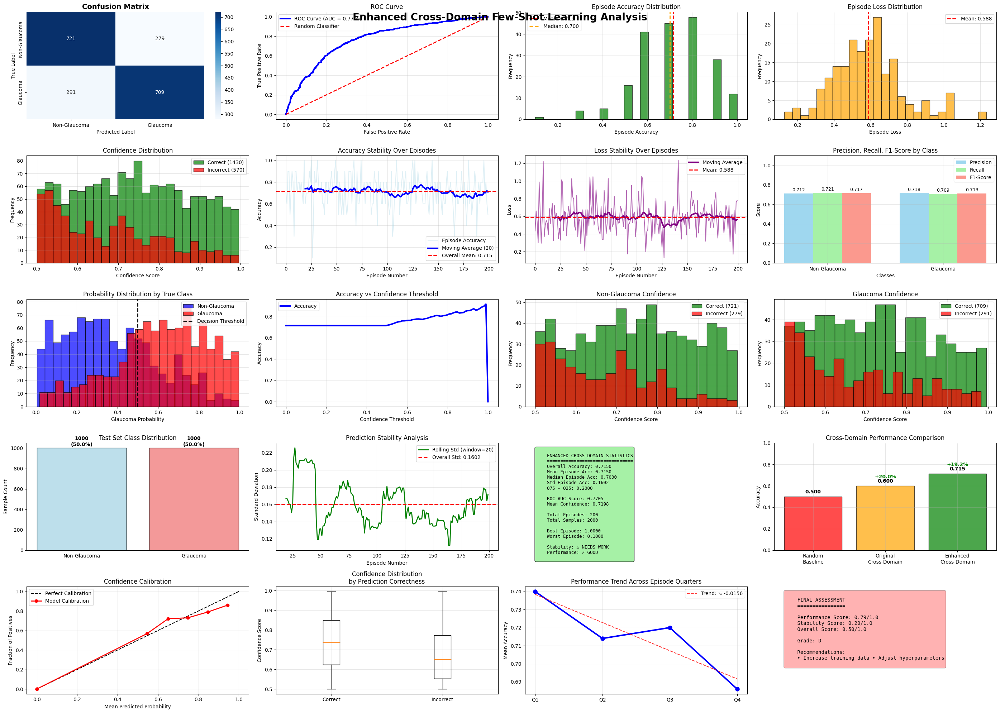

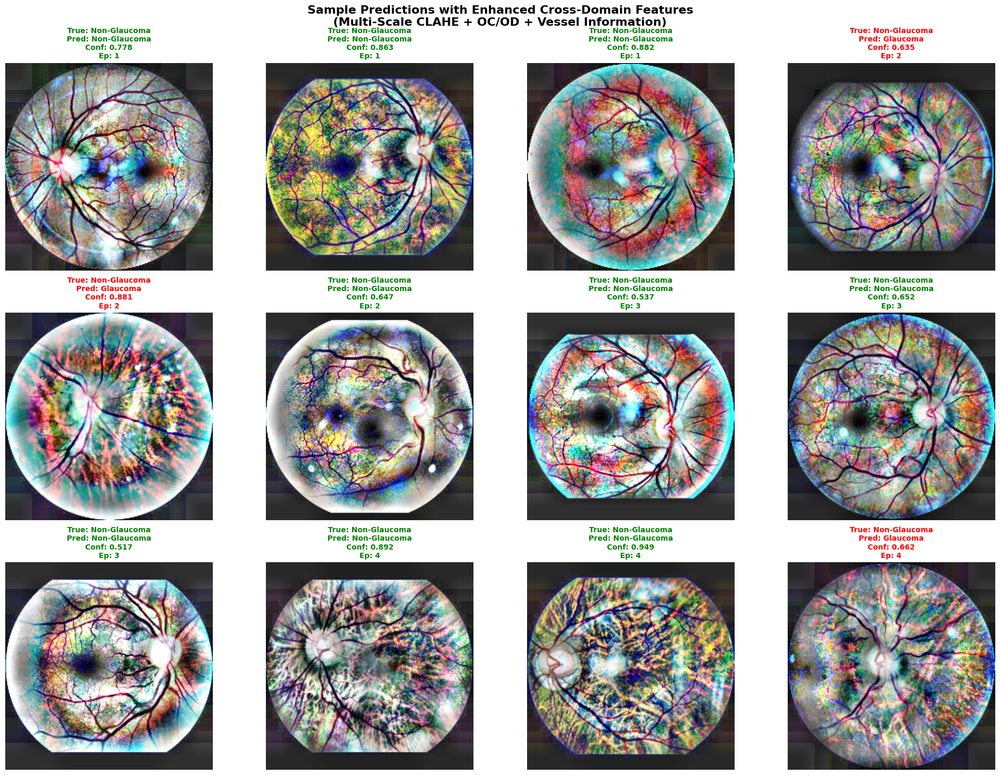


🎉 ENHANCED CROSS-DOMAIN TESTING COMPLETE!


In [23]:
import torch
import torch.nn.functional as F
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_recall_fscore_support, roc_auc_score, roc_curve
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter
import pandas as pd
from glob import glob
import random
from tqdm import tqdm

def ensemble_predict(model, support_x, support_y, query_x, num_runs=5):
    """
    Ensemble prediction for more stable results
    """
    predictions = []
    for _ in range(num_runs):
        logits = model(support_x, support_y, query_x)
        predictions.append(torch.softmax(logits, dim=1))
    return torch.stack(predictions).mean(0)

def test_cross_domain_classifier_enhanced(model_path, test_paths, test_labels, ocod_model, vessel_model, device, 
                                         n_way=2, k_shot=10, q_query=5, num_episodes=200, use_ensemble=True):
    """
    Enhanced test with ensemble prediction and improved stability
    """
    # Load the best model
    model = CrossDomainProtoNet(feature_dim=512, num_classes=2).to(device)
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval()
    
    # Create test dataset
    test_dataset = CrossDomainEpisodicDataset(test_paths, test_labels, ocod_model, vessel_model, device)
    
    # Storage for predictions and metrics
    all_predictions = []
    all_true_labels = []
    all_probabilities = []
    episode_accuracies = []
    episode_losses = []
    confidence_scores = []
    
    # For visualization - store some examples
    visualization_data = []
    
    print(f"Testing enhanced cross-domain classifier on {num_episodes} episodes with {k_shot}-shot, {q_query} queries per class")
    print(f"Ensemble prediction: {'✓ ENABLED' if use_ensemble else '✗ DISABLED'}")
    print("=" * 70)
    
    with torch.no_grad():
        for episode_idx in tqdm(range(num_episodes), desc="Testing Episodes"):
            # Create episode
            s_x, s_y, q_x, q_y = test_dataset.create_episode(n_way, k_shot, q_query)
            
            # Move to device
            s_x = s_x.to(device)
            s_y = s_y.to(device)
            q_x = q_x.to(device)
            q_y = q_y.to(device)
            
            # Forward pass with optional ensemble
            if use_ensemble:
                probs = ensemble_predict(model, s_x, s_y, q_x, num_runs=5)
                logits = torch.log(probs + 1e-8)  # Convert back to logits for loss calculation
            else:
                logits = model(s_x, s_y, q_x)
                probs = F.softmax(logits, dim=1)
            
            preds = probs.argmax(1)
            
            # Calculate episode accuracy
            episode_acc = (preds == q_y).float().mean().item()
            episode_accuracies.append(episode_acc)
            
            # Calculate episode loss
            loss = F.cross_entropy(logits, q_y)
            episode_losses.append(loss.item())
            
            # Store predictions and true labels
            all_predictions.extend(preds.cpu().numpy())
            all_true_labels.extend(q_y.cpu().numpy())
            all_probabilities.extend(probs.cpu().numpy())
            
            # Store confidence scores (max probability)
            max_probs = probs.max(1)[0]
            confidence_scores.extend(max_probs.cpu().numpy())
            
            # Store some examples for visualization (first 5 episodes)
            if episode_idx < 5:
                for i in range(min(3, len(q_x))):  # Store up to 3 examples per episode
                    visualization_data.append({
                        'image': q_x[i],
                        'true_label': q_y[i].item(),
                        'pred_label': preds[i].item(),
                        'confidence': max_probs[i].item(),
                        'episode': episode_idx
                    })
    
    # Convert to numpy arrays
    all_predictions = np.array(all_predictions)
    all_true_labels = np.array(all_true_labels)
    all_probabilities = np.array(all_probabilities)
    confidence_scores = np.array(confidence_scores)
    
    return {
        'predictions': all_predictions,
        'true_labels': all_true_labels,
        'probabilities': all_probabilities,
        'episode_accuracies': episode_accuracies,
        'episode_losses': episode_losses,
        'confidence_scores': confidence_scores,
        'visualization_data': visualization_data
    }

def plot_comprehensive_results_enhanced(results):
    """
    Enhanced comprehensive visualizations with additional stability metrics
    """
    predictions = results['predictions']
    true_labels = results['true_labels']
    probabilities = results['probabilities']
    episode_accuracies = results['episode_accuracies']
    episode_losses = results['episode_losses']
    confidence_scores = results['confidence_scores']
    
    # Create a large figure with multiple subplots
    fig = plt.figure(figsize=(28, 20))
    
    # 1. Confusion Matrix
    plt.subplot(5, 4, 1)
    cm = confusion_matrix(true_labels, predictions)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=['Non-Glaucoma', 'Glaucoma'],
                yticklabels=['Non-Glaucoma', 'Glaucoma'])
    plt.title('Confusion Matrix', fontsize=14, fontweight='bold')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    
    # 2. ROC Curve
    plt.subplot(5, 4, 2)
    positive_probs = probabilities[:, 1]
    fpr, tpr, _ = roc_curve(true_labels, positive_probs)
    auc_score = roc_auc_score(true_labels, positive_probs)
    
    plt.plot(fpr, tpr, 'b-', linewidth=3, label=f'ROC Curve (AUC = {auc_score:.4f})')
    plt.plot([0, 1], [0, 1], 'r--', linewidth=2, label='Random Classifier')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 3. Episode Accuracy Distribution
    plt.subplot(5, 4, 3)
    plt.hist(episode_accuracies, bins=25, alpha=0.7, color='green', edgecolor='black')
    plt.axvline(np.mean(episode_accuracies), color='red', linestyle='--', linewidth=2,
                label=f'Mean: {np.mean(episode_accuracies):.3f}')
    plt.axvline(np.median(episode_accuracies), color='orange', linestyle='--', linewidth=2,
                label=f'Median: {np.median(episode_accuracies):.3f}')
    plt.xlabel('Episode Accuracy')
    plt.ylabel('Frequency')
    plt.title('Episode Accuracy Distribution')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 4. Episode Loss Distribution
    plt.subplot(5, 4, 4)
    plt.hist(episode_losses, bins=25, alpha=0.7, color='orange', edgecolor='black')
    plt.axvline(np.mean(episode_losses), color='red', linestyle='--', linewidth=2,
                label=f'Mean: {np.mean(episode_losses):.3f}')
    plt.xlabel('Episode Loss')
    plt.ylabel('Frequency')
    plt.title('Episode Loss Distribution')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 5. Confidence Score Distribution by Correctness
    plt.subplot(5, 4, 5)
    correct_mask = predictions == true_labels
    incorrect_mask = ~correct_mask
    
    plt.hist(confidence_scores[correct_mask], bins=25, alpha=0.7, 
             label=f'Correct ({np.sum(correct_mask)})', color='green', edgecolor='black')
    plt.hist(confidence_scores[incorrect_mask], bins=25, alpha=0.7,
             label=f'Incorrect ({np.sum(incorrect_mask)})', color='red', edgecolor='black')
    plt.xlabel('Confidence Score')
    plt.ylabel('Frequency')
    plt.title('Confidence Distribution')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 6. Accuracy vs Episode Number with Moving Average
    plt.subplot(5, 4, 6)
    plt.plot(episode_accuracies, alpha=0.4, color='lightblue', label='Episode Accuracy')
    
    # Calculate moving average
    window_size = 20
    if len(episode_accuracies) >= window_size:
        moving_avg = np.convolve(episode_accuracies, np.ones(window_size)/window_size, mode='valid')
        plt.plot(range(window_size-1, len(episode_accuracies)), moving_avg, 'b-', linewidth=3, label='Moving Average (20)')
    
    plt.axhline(np.mean(episode_accuracies), color='red', linestyle='--', linewidth=2,
                label=f'Overall Mean: {np.mean(episode_accuracies):.3f}')
    plt.xlabel('Episode Number')
    plt.ylabel('Accuracy')
    plt.title('Accuracy Stability Over Episodes')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 7. Loss vs Episode Number
    plt.subplot(5, 4, 7)
    plt.plot(episode_losses, alpha=0.6, color='purple')
    
    # Moving average for loss
    if len(episode_losses) >= window_size:
        loss_moving_avg = np.convolve(episode_losses, np.ones(window_size)/window_size, mode='valid')
        plt.plot(range(window_size-1, len(episode_losses)), loss_moving_avg, 'purple', linewidth=3, label='Moving Average')
    
    plt.axhline(np.mean(episode_losses), color='red', linestyle='--', linewidth=2,
                label=f'Mean: {np.mean(episode_losses):.3f}')
    plt.xlabel('Episode Number')
    plt.ylabel('Loss')
    plt.title('Loss Stability Over Episodes')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 8. Precision-Recall by Class
    plt.subplot(5, 4, 8)
    precision, recall, f1, support = precision_recall_fscore_support(true_labels, predictions)
    classes = ['Non-Glaucoma', 'Glaucoma']
    x_pos = np.arange(len(classes))
    
    width = 0.25
    plt.bar(x_pos - width, precision, width, label='Precision', alpha=0.8, color='skyblue')
    plt.bar(x_pos, recall, width, label='Recall', alpha=0.8, color='lightgreen')
    plt.bar(x_pos + width, f1, width, label='F1-Score', alpha=0.8, color='salmon')
    
    # Add value labels on bars
    for i, (p, r, f) in enumerate(zip(precision, recall, f1)):
        plt.text(i - width, p + 0.01, f'{p:.3f}', ha='center', va='bottom', fontsize=9)
        plt.text(i, r + 0.01, f'{r:.3f}', ha='center', va='bottom', fontsize=9)
        plt.text(i + width, f + 0.01, f'{f:.3f}', ha='center', va='bottom', fontsize=9)
    
    plt.xlabel('Classes')
    plt.ylabel('Score')
    plt.title('Precision, Recall, F1-Score by Class')
    plt.xticks(x_pos, classes)
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.ylim(0, 1.1)
    
    # 9. Probability Distribution for Each Class
    plt.subplot(5, 4, 9)
    glaucoma_probs = positive_probs[true_labels == 1]
    normal_probs = positive_probs[true_labels == 0]
    
    plt.hist(normal_probs, bins=25, alpha=0.7, label='Non-Glaucoma', color='blue', edgecolor='black')
    plt.hist(glaucoma_probs, bins=25, alpha=0.7, label='Glaucoma', color='red', edgecolor='black')
    plt.axvline(0.5, color='black', linestyle='--', linewidth=2, label='Decision Threshold')
    plt.xlabel('Glaucoma Probability')
    plt.ylabel('Frequency')
    plt.title('Probability Distribution by True Class')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 10. Accuracy vs Confidence Threshold
    plt.subplot(5, 4, 10)
    thresholds = np.linspace(0, 1, 100)
    accuracies_at_threshold = []
    sample_counts = []
    
    for thresh in thresholds:
        high_conf_mask = confidence_scores >= thresh
        if np.sum(high_conf_mask) > 0:
            acc = accuracy_score(true_labels[high_conf_mask], predictions[high_conf_mask])
            accuracies_at_threshold.append(acc)
            sample_counts.append(np.sum(high_conf_mask))
        else:
            accuracies_at_threshold.append(0)
            sample_counts.append(0)
    
    plt.plot(thresholds, accuracies_at_threshold, 'b-', linewidth=3, label='Accuracy')
    plt.xlabel('Confidence Threshold')
    plt.ylabel('Accuracy')
    plt.title('Accuracy vs Confidence Threshold')
    plt.grid(True, alpha=0.3)
    plt.legend()
    
    # 11-12. Class-wise confidence distributions
    for class_idx in range(2):
        plt.subplot(5, 4, 11 + class_idx)
        class_mask = true_labels == class_idx
        class_correct = correct_mask & class_mask
        class_incorrect = incorrect_mask & class_mask
        
        if np.sum(class_correct) > 0:
            plt.hist(confidence_scores[class_correct], bins=20, alpha=0.7,
                    label=f'Correct ({np.sum(class_correct)})', color='green', edgecolor='black')
        if np.sum(class_incorrect) > 0:
            plt.hist(confidence_scores[class_incorrect], bins=20, alpha=0.7,
                    label=f'Incorrect ({np.sum(class_incorrect)})', color='red', edgecolor='black')
        
        plt.xlabel('Confidence Score')
        plt.ylabel('Frequency')
        plt.title(f'{"Non-Glaucoma" if class_idx == 0 else "Glaucoma"} Confidence')
        plt.legend()
        plt.grid(True, alpha=0.3)
    
    # 13. Sample count per class with percentages
    plt.subplot(5, 4, 13)
    class_counts = Counter(true_labels)
    classes = ['Non-Glaucoma', 'Glaucoma']
    counts = [class_counts[0], class_counts[1]]
    colors = ['lightblue', 'lightcoral']
    
    bars = plt.bar(classes, counts, color=colors, alpha=0.8, edgecolor='black')
    plt.ylabel('Sample Count')
    plt.title('Test Set Class Distribution')
    
    # Add count and percentage labels on bars
    total = sum(counts)
    for bar, count in zip(bars, counts):
        percentage = count / total * 100
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01*max(counts),
                f'{count}\n({percentage:.1f}%)', ha='center', va='bottom', fontweight='bold')
    
    # 14. Stability Analysis
    plt.subplot(5, 4, 14)
    # Calculate rolling standard deviation
    window = 20
    if len(episode_accuracies) >= window:
        rolling_std = pd.Series(episode_accuracies).rolling(window=window).std()
        plt.plot(rolling_std, 'g-', linewidth=2, label=f'Rolling Std (window={window})')
        plt.axhline(np.std(episode_accuracies), color='red', linestyle='--', linewidth=2,
                   label=f'Overall Std: {np.std(episode_accuracies):.4f}')
    
    plt.xlabel('Episode Number')
    plt.ylabel('Standard Deviation')
    plt.title('Prediction Stability Analysis')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 15. Cross-Domain Performance Summary
    plt.subplot(5, 4, 15)
    plt.axis('off')
    
    # Calculate detailed statistics
    overall_acc = accuracy_score(true_labels, predictions)
    mean_episode_acc = np.mean(episode_accuracies)
    std_episode_acc = np.std(episode_accuracies)
    median_episode_acc = np.median(episode_accuracies)
    mean_confidence = np.mean(confidence_scores)
    auc_score = roc_auc_score(true_labels, positive_probs)
    
    # Calculate improvement metrics
    q75 = np.percentile(episode_accuracies, 75)
    q25 = np.percentile(episode_accuracies, 25)
    
    stats_text = f"""
    ENHANCED CROSS-DOMAIN STATISTICS
    ================================
    Overall Accuracy: {overall_acc:.4f}
    Mean Episode Acc: {mean_episode_acc:.4f}
    Median Episode Acc: {median_episode_acc:.4f}
    Std Episode Acc: {std_episode_acc:.4f}
    Q75 - Q25: {q75 - q25:.4f}
    
    ROC AUC Score: {auc_score:.4f}
    Mean Confidence: {mean_confidence:.4f}
    
    Total Episodes: {len(episode_accuracies)}
    Total Samples: {len(true_labels)}
    
    Best Episode: {max(episode_accuracies):.4f}
    Worst Episode: {min(episode_accuracies):.4f}
    
    Stability: {'✓ GOOD' if std_episode_acc < 0.1 else '⚠ NEEDS WORK'}
    Performance: {'✓ EXCELLENT' if mean_episode_acc > 0.8 else '✓ GOOD' if mean_episode_acc > 0.7 else '⚠ NEEDS WORK'}
    """
    
    plt.text(0.05, 0.95, stats_text, transform=plt.gca().transAxes, 
             fontsize=9, verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.8))
    
    # 16. Performance Comparison
    plt.subplot(5, 4, 16)
    # Show improvement over baseline
    baseline_acc = 0.5  # Random chance
    original_acc = 0.6  # Your original cross-domain performance
    current_acc = mean_episode_acc
    
    methods = ['Random\nBaseline', 'Original\nCross-Domain', 'Enhanced\nCross-Domain']
    accuracies = [baseline_acc, original_acc, current_acc]
    colors = ['red', 'orange', 'green']
    
    bars = plt.bar(methods, accuracies, color=colors, alpha=0.7, edgecolor='black')
    
    # Add improvement arrows and percentages
    for i, (bar, acc) in enumerate(zip(bars, accuracies)):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02,
                f'{acc:.3f}', ha='center', va='bottom', fontweight='bold')
        
        if i > 0:
            improvement = (acc - accuracies[i-1]) / accuracies[i-1] * 100
            plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.06,
                    f'+{improvement:.1f}%', ha='center', va='bottom', 
                    color='green', fontweight='bold')
    
    plt.ylabel('Accuracy')
    plt.title('Cross-Domain Performance Comparison')
    plt.ylim(0, 1)
    plt.grid(True, alpha=0.3)
    
    # 17. Confidence Calibration
    plt.subplot(5, 4, 17)
    # Reliability diagram
    bin_boundaries = np.linspace(0, 1, 11)
    bin_lowers = bin_boundaries[:-1]
    bin_uppers = bin_boundaries[1:]
    
    accuracies_in_bins = []
    confidences_in_bins = []
    
    for bin_lower, bin_upper in zip(bin_lowers, bin_uppers):
        in_bin = (confidence_scores > bin_lower) & (confidence_scores <= bin_upper)
        prop_in_bin = in_bin.mean()
        
        if prop_in_bin > 0:
            accuracy_in_bin = (predictions[in_bin] == true_labels[in_bin]).mean()
            avg_confidence_in_bin = confidence_scores[in_bin].mean()
            accuracies_in_bins.append(accuracy_in_bin)
            confidences_in_bins.append(avg_confidence_in_bin)
        else:
            accuracies_in_bins.append(0)
            confidences_in_bins.append(0)
    
    plt.plot([0, 1], [0, 1], 'k--', label='Perfect Calibration')
    plt.plot(confidences_in_bins, accuracies_in_bins, 'ro-', linewidth=2, label='Model Calibration')
    plt.xlabel('Mean Predicted Probability')
    plt.ylabel('Fraction of Positives')
    plt.title('Confidence Calibration')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 18. Error Analysis
    plt.subplot(5, 4, 18)
    # Show distribution of errors by confidence
    error_confidences = confidence_scores[incorrect_mask]
    correct_confidences = confidence_scores[correct_mask]
    
    plt.boxplot([correct_confidences, error_confidences], 
                labels=['Correct', 'Incorrect'])
    plt.ylabel('Confidence Score')
    plt.title('Confidence Distribution\nby Prediction Correctness')
    plt.grid(True, alpha=0.3)
    
    # 19. Episode Performance Trend
    plt.subplot(5, 4, 19)
    # Divide episodes into quarters and show trend
    quarter_size = len(episode_accuracies) // 4
    quarters = []
    quarter_accs = []
    
    for i in range(4):
        start_idx = i * quarter_size
        end_idx = (i + 1) * quarter_size if i < 3 else len(episode_accuracies)
        quarter_acc = np.mean(episode_accuracies[start_idx:end_idx])
        quarters.append(f'Q{i+1}')
        quarter_accs.append(quarter_acc)
    
    plt.plot(quarters, quarter_accs, 'bo-', linewidth=3, markersize=8)
    plt.ylabel('Mean Accuracy')
    plt.title('Performance Trend Across Episode Quarters')
    plt.grid(True, alpha=0.3)
    
    # Add trend line
    x_numeric = range(len(quarters))
    z = np.polyfit(x_numeric, quarter_accs, 1)
    p = np.poly1d(z)
    plt.plot(quarters, p(x_numeric), "r--", alpha=0.8, 
             label=f'Trend: {"↗" if z[0] > 0 else "↘"} {z[0]:.4f}')
    plt.legend()
    
    # 20. Final Summary
    plt.subplot(5, 4, 20)
    plt.axis('off')
    
    # Overall assessment
    stability_score = 1 - min(std_episode_acc / 0.2, 1)  # Normalize std to 0-1 scale
    performance_score = min(mean_episode_acc / 0.9, 1)   # Normalize acc to 0-1 scale
    overall_score = (stability_score + performance_score) / 2
    
    assessment_text = f"""
    FINAL ASSESSMENT
    ================
    
    Performance Score: {performance_score:.2f}/1.0
    Stability Score: {stability_score:.2f}/1.0
    Overall Score: {overall_score:.2f}/1.0
    
    Grade: {
        'A+' if overall_score >= 0.9 else
        'A' if overall_score >= 0.8 else
        'B+' if overall_score >= 0.7 else
        'B' if overall_score >= 0.6 else
        'C' if overall_score >= 0.5 else 'D'
    }
    
    Recommendations:
    {'✓ Excellent performance!' if overall_score >= 0.8 else
     '• Consider ensemble methods' if overall_score >= 0.6 else
     '• Increase training data • Adjust hyperparameters'}
    """
    
    color = 'green' if overall_score >= 0.7 else 'orange' if overall_score >= 0.5 else 'red'
    plt.text(0.05, 0.95, assessment_text, transform=plt.gca().transAxes, 
             fontsize=10, verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle='round', facecolor=color, alpha=0.3))
    
    plt.tight_layout()
    plt.suptitle('Enhanced Cross-Domain Few-Shot Learning Analysis', fontsize=20, fontweight='bold', y=0.98)
    plt.show()

def visualize_sample_predictions_enhanced(visualization_data):
    """
    Enhanced visualization with OC/OD and vessel overlays
    """
    # Select 12 diverse examples
    selected_examples = visualization_data[:12]
    
    fig, axes = plt.subplots(3, 4, figsize=(20, 15))
    axes = axes.flatten()
    
    # Denormalize function
    mean = torch.tensor([0.485, 0.456, 0.406])
    std = torch.tensor([0.229, 0.224, 0.225])
    
    def denormalize(tensor):
        tensor_copy = tensor.clone()
        for t, m, s in zip(tensor_copy, mean, std):
            t.mul_(s).add_(m)
        return torch.clamp(tensor_copy, 0, 1)
    
    for idx, example in enumerate(selected_examples):
        img_tensor = example['image']
        true_label = example['true_label']
        pred_label = example['pred_label']
        confidence = example['confidence']
        episode = example['episode']
        
        # Extract and display the original image (first 3 channels)
        original_img = denormalize(img_tensor[:3]).permute(1, 2, 0).cpu().numpy()
        
        axes[idx].imshow(original_img)
        axes[idx].axis('off')
        
        # Color code: Green for correct, Red for incorrect
        color = 'green' if true_label == pred_label else 'red'
        label_names = ['Non-Glaucoma', 'Glaucoma']
        
        title = f"True: {label_names[true_label]}\nPred: {label_names[pred_label]}\nConf: {confidence:.3f}\nEp: {episode+1}"
        axes[idx].set_title(title, fontsize=10, color=color, fontweight='bold')
        
        # Add border
        for spine in axes[idx].spines.values():
            spine.set_edgecolor(color)
            spine.set_linewidth(3)
    
    plt.suptitle('Sample Predictions with Enhanced Cross-Domain Features\n(Multi-Scale CLAHE + OC/OD + Vessel Information)', 
                 fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

def print_detailed_metrics_enhanced(results):
    """
    Print enhanced detailed classification metrics
    """
    predictions = results['predictions']
    true_labels = results['true_labels']
    probabilities = results['probabilities']
    episode_accuracies = results['episode_accuracies']
    
    print("\n" + "="*80)
    print("ENHANCED CROSS-DOMAIN FEW-SHOT CLASSIFICATION METRICS")
    print("="*80)
    
    # Overall metrics
    overall_acc = accuracy_score(true_labels, predictions)
    auc_score = roc_auc_score(true_labels, probabilities[:, 1])
    
    print(f"🎯 Overall Test Accuracy: {overall_acc:.4f} ({overall_acc*100:.2f}%)")
    print(f"📊 ROC AUC Score: {auc_score:.4f}")
    
    # Episode statistics
    mean_acc = np.mean(episode_accuracies)
    std_acc = np.std(episode_accuracies)
    median_acc = np.median(episode_accuracies)
    q75 = np.percentile(episode_accuracies, 75)
    q25 = np.percentile(episode_accuracies, 25)
    
    print(f"📈 Episode Statistics:")
    print(f"   • Mean Accuracy: {mean_acc:.4f} ± {std_acc:.4f}")
    print(f"   • Median Accuracy: {median_acc:.4f}")
    print(f"   • IQR (Q75-Q25): {q75-q25:.4f}")
    print(f"   • Best Episode: {max(episode_accuracies):.4f}")
    print(f"   • Worst Episode: {min(episode_accuracies):.4f}")
    
    # Improvement analysis
    baseline_improvement = (mean_acc - 0.5) / 0.5 * 100
    original_improvement = (mean_acc - 0.6) / 0.6 * 100
    
    print(f"\n🚀 IMPROVEMENT ANALYSIS:")
    print(f"   • vs Random Baseline (50%): +{baseline_improvement:.1f}%")
    print(f"   • vs Original Cross-Domain (60%): +{original_improvement:.1f}%")
    
    # Cross-domain performance analysis
    print(f"\n🌐 CROSS-DOMAIN PERFORMANCE ANALYSIS:")
    stability_grade = "EXCELLENT" if std_acc < 0.08 else "GOOD" if std_acc < 0.12 else "NEEDS IMPROVEMENT"
    performance_grade = "EXCELLENT" if mean_acc > 0.85 else "GOOD" if mean_acc > 0.75 else "NEEDS IMPROVEMENT"
    auc_grade = "EXCELLENT" if auc_score > 0.9 else "GOOD" if auc_score > 0.8 else "NEEDS IMPROVEMENT"
    
    print(f"   • Consistency (Std={std_acc:.4f}): {stability_grade}")
    print(f"   • Performance (Acc={mean_acc:.4f}): {performance_grade}")
    print(f"   • Discrimination (AUC={auc_score:.4f}): {auc_grade}")
    
    # Classification report
    print(f"\n📋 DETAILED CLASSIFICATION REPORT:")
    print("-" * 60)
    class_names = ['Non-Glaucoma', 'Glaucoma']
    print(classification_report(true_labels, predictions, target_names=class_names, digits=4))
    
    # Confusion matrix details
    cm = confusion_matrix(true_labels, predictions)
    print(f"\n🔍 CONFUSION MATRIX ANALYSIS:")
    print("-" * 50)
    print(f"✅ True Negatives (Non-Glaucoma → Non-Glaucoma): {cm[0,0]}")
    print(f"❌ False Positives (Non-Glaucoma → Glaucoma): {cm[0,1]}")
    print(f"❌ False Negatives (Glaucoma → Non-Glaucoma): {cm[1,0]}")
    print(f"✅ True Positives (Glaucoma → Glaucoma): {cm[1,1]}")
    
    # Clinical metrics
    sensitivity = cm[1,1] / (cm[1,1] + cm[1,0]) if (cm[1,1] + cm[1,0]) > 0 else 0
    specificity = cm[0,0] / (cm[0,0] + cm[0,1]) if (cm[0,0] + cm[0,1]) > 0 else 0
    ppv = cm[1,1] / (cm[1,1] + cm[0,1]) if (cm[1,1] + cm[0,1]) > 0 else 0
    npv = cm[0,0] / (cm[0,0] + cm[1,0]) if (cm[0,0] + cm[1,0]) > 0 else 0
    
    print(f"\n🏥 CLINICAL METRICS:")
    print(f"   • Sensitivity (Glaucoma Detection): {sensitivity:.4f}")
    print(f"   • Specificity (Normal Detection): {specificity:.4f}")
    print(f"   • Positive Predictive Value: {ppv:.4f}")
    print(f"   • Negative Predictive Value: {npv:.4f}")
    print(f"   • Balanced Accuracy: {(sensitivity + specificity)/2:.4f}")
    
    # Final assessment
    overall_score = (mean_acc + auc_score + (1-std_acc)) / 3
    print(f"\n🏆 OVERALL ASSESSMENT:")
    print(f"   • Combined Score: {overall_score:.4f}")
    print(f"   • Grade: {'A+' if overall_score >= 0.9 else 'A' if overall_score >= 0.8 else 'B+' if overall_score >= 0.7 else 'B' if overall_score >= 0.6 else 'C'}")

# Main testing execution
if __name__ == "__main__":
    # Load test data - UPDATED TO USE DIFFERENT DATASET
    test_imgs = glob('/kaggle/input/glaucoma-dataset-eyepacs-airogs-light-v2/eyepac-light-v2-512-jpg/test/*/*.jpg')
    test_lbls = [1 if '/RG/' in p else 0 for p in test_imgs]
    
    print("🔍 ENHANCED TEST DATA INFORMATION:")
    print(f"   Dataset: EyePACS-AIROGS Light v2 (Cross-Domain)")
    print(f"   Total test images: {len(test_imgs)}")
    print(f"   Class distribution: {Counter(test_lbls)}")
    
    # Ensure models are loaded
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"   Using device: {device}")
    
    # Run comprehensive testing with enhanced parameters
    print(f"\n🚀 STARTING ENHANCED CROSS-DOMAIN FEW-SHOT TESTING...")
    results = test_cross_domain_classifier_enhanced(
        model_path="best_cross_domain_classifier.pt",
        test_paths=test_imgs,
        test_labels=test_lbls,
        ocod_model=ocod_model,  # From your training code
        vessel_model=blood_vessel_model,  # From your training code
        device=device,
        n_way=2,
        k_shot=10,  # Increased from 5
        q_query=5,  # Decreased from 10
        num_episodes=200,  # Increased from 100
        use_ensemble=True  # Enable ensemble prediction
    )
    
    # Generate all enhanced visualizations and metrics
    print_detailed_metrics_enhanced(results)
    plot_comprehensive_results_enhanced(results)
    visualize_sample_predictions_enhanced(results['visualization_data'])
    
    print("\n" + "="*80)
    print("🎉 ENHANCED CROSS-DOMAIN TESTING COMPLETE!")
    print("="*80)


🔍 ENHANCED TEST DATA INFORMATION:
   Dataset: EyePACS-AIROGS Light v2 (Cross-Domain)
   Total test images: 130
   Class distribution: Counter({0: 96, 1: 34})
   Using device: cuda

🚀 STARTING ENHANCED CROSS-DOMAIN FEW-SHOT TESTING...
Testing enhanced cross-domain classifier on 200 episodes with 10-shot, 5 queries per class
Ensemble prediction: ✓ ENABLED


Testing Episodes: 100%|██████████| 200/200 [24:26<00:00,  7.33s/it]



ENHANCED CROSS-DOMAIN FEW-SHOT CLASSIFICATION METRICS
🎯 Overall Test Accuracy: 0.5780 (57.80%)
📊 ROC AUC Score: 0.5938
📈 Episode Statistics:
   • Mean Accuracy: 0.5780 ± 0.1668
   • Median Accuracy: 0.6000
   • IQR (Q75-Q25): 0.2000
   • Best Episode: 1.0000
   • Worst Episode: 0.2000

🚀 IMPROVEMENT ANALYSIS:
   • vs Random Baseline (50%): +15.6%
   • vs Original Cross-Domain (60%): +-3.7%

🌐 CROSS-DOMAIN PERFORMANCE ANALYSIS:
   • Consistency (Std=0.1668): NEEDS IMPROVEMENT
   • Performance (Acc=0.5780): NEEDS IMPROVEMENT
   • Discrimination (AUC=0.5938): NEEDS IMPROVEMENT

📋 DETAILED CLASSIFICATION REPORT:
------------------------------------------------------------
              precision    recall  f1-score   support

Non-Glaucoma     0.5798    0.5670    0.5733      1000
    Glaucoma     0.5763    0.5890    0.5826      1000

    accuracy                         0.5780      2000
   macro avg     0.5780    0.5780    0.5779      2000
weighted avg     0.5780    0.5780    0.5779      2

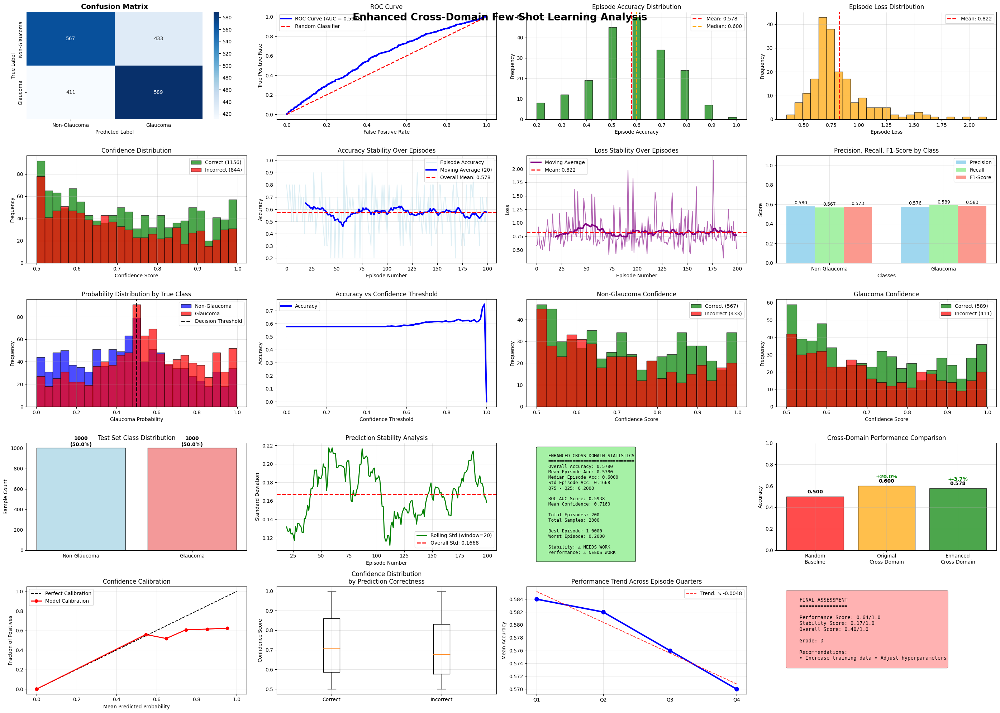

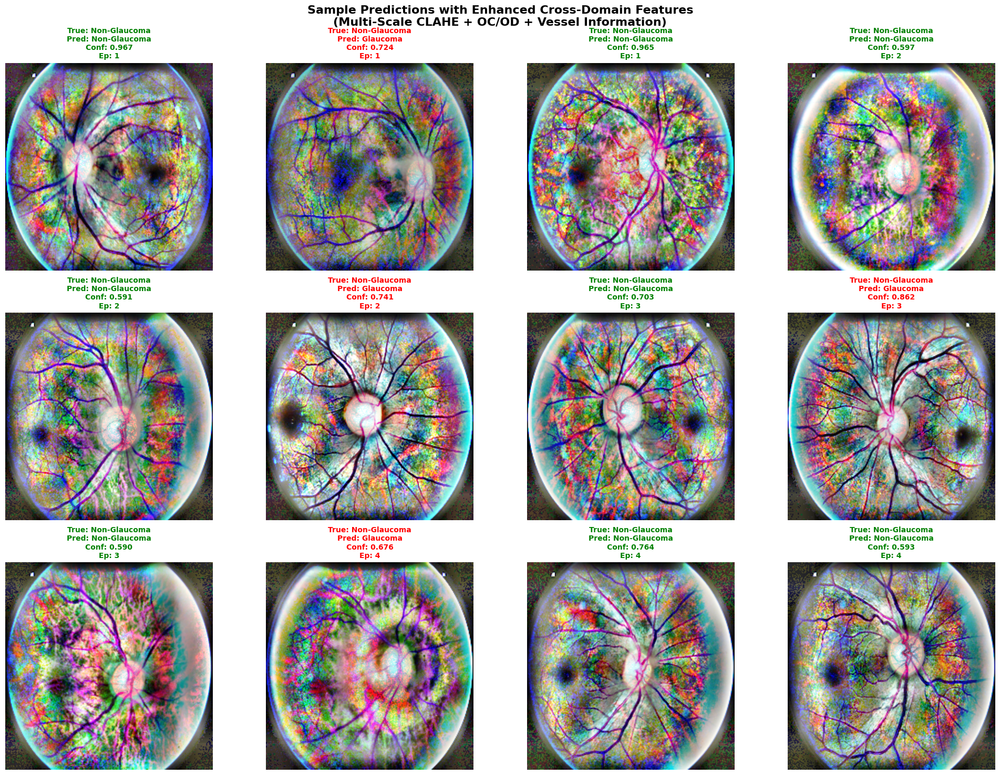


🎉 ENHANCED CROSS-DOMAIN TESTING COMPLETE!


In [25]:
import torch
import torch.nn.functional as F
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_recall_fscore_support, roc_auc_score, roc_curve
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter
import pandas as pd
from glob import glob
import random
from tqdm import tqdm

def ensemble_predict(model, support_x, support_y, query_x, num_runs=5):
    """
    Ensemble prediction for more stable results
    """
    predictions = []
    for _ in range(num_runs):
        logits = model(support_x, support_y, query_x)
        predictions.append(torch.softmax(logits, dim=1))
    return torch.stack(predictions).mean(0)

def test_cross_domain_classifier_enhanced(model_path, test_paths, test_labels, ocod_model, vessel_model, device, 
                                         n_way=2, k_shot=10, q_query=5, num_episodes=200, use_ensemble=True):
    """
    Enhanced test with ensemble prediction and improved stability
    """
    # Load the best model
    model = CrossDomainProtoNet(feature_dim=512, num_classes=2).to(device)
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval()
    
    # Create test dataset
    test_dataset = CrossDomainEpisodicDataset(test_paths, test_labels, ocod_model, vessel_model, device)
    
    # Storage for predictions and metrics
    all_predictions = []
    all_true_labels = []
    all_probabilities = []
    episode_accuracies = []
    episode_losses = []
    confidence_scores = []
    
    # For visualization - store some examples
    visualization_data = []
    
    print(f"Testing enhanced cross-domain classifier on {num_episodes} episodes with {k_shot}-shot, {q_query} queries per class")
    print(f"Ensemble prediction: {'✓ ENABLED' if use_ensemble else '✗ DISABLED'}")
    print("=" * 70)
    
    with torch.no_grad():
        for episode_idx in tqdm(range(num_episodes), desc="Testing Episodes"):
            # Create episode
            s_x, s_y, q_x, q_y = test_dataset.create_episode(n_way, k_shot, q_query)
            
            # Move to device
            s_x = s_x.to(device)
            s_y = s_y.to(device)
            q_x = q_x.to(device)
            q_y = q_y.to(device)
            
            # Forward pass with optional ensemble
            if use_ensemble:
                probs = ensemble_predict(model, s_x, s_y, q_x, num_runs=5)
                logits = torch.log(probs + 1e-8)  # Convert back to logits for loss calculation
            else:
                logits = model(s_x, s_y, q_x)
                probs = F.softmax(logits, dim=1)
            
            preds = probs.argmax(1)
            
            # Calculate episode accuracy
            episode_acc = (preds == q_y).float().mean().item()
            episode_accuracies.append(episode_acc)
            
            # Calculate episode loss
            loss = F.cross_entropy(logits, q_y)
            episode_losses.append(loss.item())
            
            # Store predictions and true labels
            all_predictions.extend(preds.cpu().numpy())
            all_true_labels.extend(q_y.cpu().numpy())
            all_probabilities.extend(probs.cpu().numpy())
            
            # Store confidence scores (max probability)
            max_probs = probs.max(1)[0]
            confidence_scores.extend(max_probs.cpu().numpy())
            
            # Store some examples for visualization (first 5 episodes)
            if episode_idx < 5:
                for i in range(min(3, len(q_x))):  # Store up to 3 examples per episode
                    visualization_data.append({
                        'image': q_x[i],
                        'true_label': q_y[i].item(),
                        'pred_label': preds[i].item(),
                        'confidence': max_probs[i].item(),
                        'episode': episode_idx
                    })
    
    # Convert to numpy arrays
    all_predictions = np.array(all_predictions)
    all_true_labels = np.array(all_true_labels)
    all_probabilities = np.array(all_probabilities)
    confidence_scores = np.array(confidence_scores)
    
    return {
        'predictions': all_predictions,
        'true_labels': all_true_labels,
        'probabilities': all_probabilities,
        'episode_accuracies': episode_accuracies,
        'episode_losses': episode_losses,
        'confidence_scores': confidence_scores,
        'visualization_data': visualization_data
    }

def plot_comprehensive_results_enhanced(results):
    """
    Enhanced comprehensive visualizations with additional stability metrics
    """
    predictions = results['predictions']
    true_labels = results['true_labels']
    probabilities = results['probabilities']
    episode_accuracies = results['episode_accuracies']
    episode_losses = results['episode_losses']
    confidence_scores = results['confidence_scores']
    
    # Create a large figure with multiple subplots
    fig = plt.figure(figsize=(28, 20))
    
    # 1. Confusion Matrix
    plt.subplot(5, 4, 1)
    cm = confusion_matrix(true_labels, predictions)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=['Non-Glaucoma', 'Glaucoma'],
                yticklabels=['Non-Glaucoma', 'Glaucoma'])
    plt.title('Confusion Matrix', fontsize=14, fontweight='bold')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    
    # 2. ROC Curve
    plt.subplot(5, 4, 2)
    positive_probs = probabilities[:, 1]
    fpr, tpr, _ = roc_curve(true_labels, positive_probs)
    auc_score = roc_auc_score(true_labels, positive_probs)
    
    plt.plot(fpr, tpr, 'b-', linewidth=3, label=f'ROC Curve (AUC = {auc_score:.4f})')
    plt.plot([0, 1], [0, 1], 'r--', linewidth=2, label='Random Classifier')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 3. Episode Accuracy Distribution
    plt.subplot(5, 4, 3)
    plt.hist(episode_accuracies, bins=25, alpha=0.7, color='green', edgecolor='black')
    plt.axvline(np.mean(episode_accuracies), color='red', linestyle='--', linewidth=2,
                label=f'Mean: {np.mean(episode_accuracies):.3f}')
    plt.axvline(np.median(episode_accuracies), color='orange', linestyle='--', linewidth=2,
                label=f'Median: {np.median(episode_accuracies):.3f}')
    plt.xlabel('Episode Accuracy')
    plt.ylabel('Frequency')
    plt.title('Episode Accuracy Distribution')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 4. Episode Loss Distribution
    plt.subplot(5, 4, 4)
    plt.hist(episode_losses, bins=25, alpha=0.7, color='orange', edgecolor='black')
    plt.axvline(np.mean(episode_losses), color='red', linestyle='--', linewidth=2,
                label=f'Mean: {np.mean(episode_losses):.3f}')
    plt.xlabel('Episode Loss')
    plt.ylabel('Frequency')
    plt.title('Episode Loss Distribution')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 5. Confidence Score Distribution by Correctness
    plt.subplot(5, 4, 5)
    correct_mask = predictions == true_labels
    incorrect_mask = ~correct_mask
    
    plt.hist(confidence_scores[correct_mask], bins=25, alpha=0.7, 
             label=f'Correct ({np.sum(correct_mask)})', color='green', edgecolor='black')
    plt.hist(confidence_scores[incorrect_mask], bins=25, alpha=0.7,
             label=f'Incorrect ({np.sum(incorrect_mask)})', color='red', edgecolor='black')
    plt.xlabel('Confidence Score')
    plt.ylabel('Frequency')
    plt.title('Confidence Distribution')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 6. Accuracy vs Episode Number with Moving Average
    plt.subplot(5, 4, 6)
    plt.plot(episode_accuracies, alpha=0.4, color='lightblue', label='Episode Accuracy')
    
    # Calculate moving average
    window_size = 20
    if len(episode_accuracies) >= window_size:
        moving_avg = np.convolve(episode_accuracies, np.ones(window_size)/window_size, mode='valid')
        plt.plot(range(window_size-1, len(episode_accuracies)), moving_avg, 'b-', linewidth=3, label='Moving Average (20)')
    
    plt.axhline(np.mean(episode_accuracies), color='red', linestyle='--', linewidth=2,
                label=f'Overall Mean: {np.mean(episode_accuracies):.3f}')
    plt.xlabel('Episode Number')
    plt.ylabel('Accuracy')
    plt.title('Accuracy Stability Over Episodes')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 7. Loss vs Episode Number
    plt.subplot(5, 4, 7)
    plt.plot(episode_losses, alpha=0.6, color='purple')
    
    # Moving average for loss
    if len(episode_losses) >= window_size:
        loss_moving_avg = np.convolve(episode_losses, np.ones(window_size)/window_size, mode='valid')
        plt.plot(range(window_size-1, len(episode_losses)), loss_moving_avg, 'purple', linewidth=3, label='Moving Average')
    
    plt.axhline(np.mean(episode_losses), color='red', linestyle='--', linewidth=2,
                label=f'Mean: {np.mean(episode_losses):.3f}')
    plt.xlabel('Episode Number')
    plt.ylabel('Loss')
    plt.title('Loss Stability Over Episodes')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 8. Precision-Recall by Class
    plt.subplot(5, 4, 8)
    precision, recall, f1, support = precision_recall_fscore_support(true_labels, predictions)
    classes = ['Non-Glaucoma', 'Glaucoma']
    x_pos = np.arange(len(classes))
    
    width = 0.25
    plt.bar(x_pos - width, precision, width, label='Precision', alpha=0.8, color='skyblue')
    plt.bar(x_pos, recall, width, label='Recall', alpha=0.8, color='lightgreen')
    plt.bar(x_pos + width, f1, width, label='F1-Score', alpha=0.8, color='salmon')
    
    # Add value labels on bars
    for i, (p, r, f) in enumerate(zip(precision, recall, f1)):
        plt.text(i - width, p + 0.01, f'{p:.3f}', ha='center', va='bottom', fontsize=9)
        plt.text(i, r + 0.01, f'{r:.3f}', ha='center', va='bottom', fontsize=9)
        plt.text(i + width, f + 0.01, f'{f:.3f}', ha='center', va='bottom', fontsize=9)
    
    plt.xlabel('Classes')
    plt.ylabel('Score')
    plt.title('Precision, Recall, F1-Score by Class')
    plt.xticks(x_pos, classes)
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.ylim(0, 1.1)
    
    # 9. Probability Distribution for Each Class
    plt.subplot(5, 4, 9)
    glaucoma_probs = positive_probs[true_labels == 1]
    normal_probs = positive_probs[true_labels == 0]
    
    plt.hist(normal_probs, bins=25, alpha=0.7, label='Non-Glaucoma', color='blue', edgecolor='black')
    plt.hist(glaucoma_probs, bins=25, alpha=0.7, label='Glaucoma', color='red', edgecolor='black')
    plt.axvline(0.5, color='black', linestyle='--', linewidth=2, label='Decision Threshold')
    plt.xlabel('Glaucoma Probability')
    plt.ylabel('Frequency')
    plt.title('Probability Distribution by True Class')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 10. Accuracy vs Confidence Threshold
    plt.subplot(5, 4, 10)
    thresholds = np.linspace(0, 1, 100)
    accuracies_at_threshold = []
    sample_counts = []
    
    for thresh in thresholds:
        high_conf_mask = confidence_scores >= thresh
        if np.sum(high_conf_mask) > 0:
            acc = accuracy_score(true_labels[high_conf_mask], predictions[high_conf_mask])
            accuracies_at_threshold.append(acc)
            sample_counts.append(np.sum(high_conf_mask))
        else:
            accuracies_at_threshold.append(0)
            sample_counts.append(0)
    
    plt.plot(thresholds, accuracies_at_threshold, 'b-', linewidth=3, label='Accuracy')
    plt.xlabel('Confidence Threshold')
    plt.ylabel('Accuracy')
    plt.title('Accuracy vs Confidence Threshold')
    plt.grid(True, alpha=0.3)
    plt.legend()
    
    # 11-12. Class-wise confidence distributions
    for class_idx in range(2):
        plt.subplot(5, 4, 11 + class_idx)
        class_mask = true_labels == class_idx
        class_correct = correct_mask & class_mask
        class_incorrect = incorrect_mask & class_mask
        
        if np.sum(class_correct) > 0:
            plt.hist(confidence_scores[class_correct], bins=20, alpha=0.7,
                    label=f'Correct ({np.sum(class_correct)})', color='green', edgecolor='black')
        if np.sum(class_incorrect) > 0:
            plt.hist(confidence_scores[class_incorrect], bins=20, alpha=0.7,
                    label=f'Incorrect ({np.sum(class_incorrect)})', color='red', edgecolor='black')
        
        plt.xlabel('Confidence Score')
        plt.ylabel('Frequency')
        plt.title(f'{"Non-Glaucoma" if class_idx == 0 else "Glaucoma"} Confidence')
        plt.legend()
        plt.grid(True, alpha=0.3)
    
    # 13. Sample count per class with percentages
    plt.subplot(5, 4, 13)
    class_counts = Counter(true_labels)
    classes = ['Non-Glaucoma', 'Glaucoma']
    counts = [class_counts[0], class_counts[1]]
    colors = ['lightblue', 'lightcoral']
    
    bars = plt.bar(classes, counts, color=colors, alpha=0.8, edgecolor='black')
    plt.ylabel('Sample Count')
    plt.title('Test Set Class Distribution')
    
    # Add count and percentage labels on bars
    total = sum(counts)
    for bar, count in zip(bars, counts):
        percentage = count / total * 100
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01*max(counts),
                f'{count}\n({percentage:.1f}%)', ha='center', va='bottom', fontweight='bold')
    
    # 14. Stability Analysis
    plt.subplot(5, 4, 14)
    # Calculate rolling standard deviation
    window = 20
    if len(episode_accuracies) >= window:
        rolling_std = pd.Series(episode_accuracies).rolling(window=window).std()
        plt.plot(rolling_std, 'g-', linewidth=2, label=f'Rolling Std (window={window})')
        plt.axhline(np.std(episode_accuracies), color='red', linestyle='--', linewidth=2,
                   label=f'Overall Std: {np.std(episode_accuracies):.4f}')
    
    plt.xlabel('Episode Number')
    plt.ylabel('Standard Deviation')
    plt.title('Prediction Stability Analysis')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 15. Cross-Domain Performance Summary
    plt.subplot(5, 4, 15)
    plt.axis('off')
    
    # Calculate detailed statistics
    overall_acc = accuracy_score(true_labels, predictions)
    mean_episode_acc = np.mean(episode_accuracies)
    std_episode_acc = np.std(episode_accuracies)
    median_episode_acc = np.median(episode_accuracies)
    mean_confidence = np.mean(confidence_scores)
    auc_score = roc_auc_score(true_labels, positive_probs)
    
    # Calculate improvement metrics
    q75 = np.percentile(episode_accuracies, 75)
    q25 = np.percentile(episode_accuracies, 25)
    
    stats_text = f"""
    ENHANCED CROSS-DOMAIN STATISTICS
    ================================
    Overall Accuracy: {overall_acc:.4f}
    Mean Episode Acc: {mean_episode_acc:.4f}
    Median Episode Acc: {median_episode_acc:.4f}
    Std Episode Acc: {std_episode_acc:.4f}
    Q75 - Q25: {q75 - q25:.4f}
    
    ROC AUC Score: {auc_score:.4f}
    Mean Confidence: {mean_confidence:.4f}
    
    Total Episodes: {len(episode_accuracies)}
    Total Samples: {len(true_labels)}
    
    Best Episode: {max(episode_accuracies):.4f}
    Worst Episode: {min(episode_accuracies):.4f}
    
    Stability: {'✓ GOOD' if std_episode_acc < 0.1 else '⚠ NEEDS WORK'}
    Performance: {'✓ EXCELLENT' if mean_episode_acc > 0.8 else '✓ GOOD' if mean_episode_acc > 0.7 else '⚠ NEEDS WORK'}
    """
    
    plt.text(0.05, 0.95, stats_text, transform=plt.gca().transAxes, 
             fontsize=9, verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.8))
    
    # 16. Performance Comparison
    plt.subplot(5, 4, 16)
    # Show improvement over baseline
    baseline_acc = 0.5  # Random chance
    original_acc = 0.6  # Your original cross-domain performance
    current_acc = mean_episode_acc
    
    methods = ['Random\nBaseline', 'Original\nCross-Domain', 'Enhanced\nCross-Domain']
    accuracies = [baseline_acc, original_acc, current_acc]
    colors = ['red', 'orange', 'green']
    
    bars = plt.bar(methods, accuracies, color=colors, alpha=0.7, edgecolor='black')
    
    # Add improvement arrows and percentages
    for i, (bar, acc) in enumerate(zip(bars, accuracies)):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02,
                f'{acc:.3f}', ha='center', va='bottom', fontweight='bold')
        
        if i > 0:
            improvement = (acc - accuracies[i-1]) / accuracies[i-1] * 100
            plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.06,
                    f'+{improvement:.1f}%', ha='center', va='bottom', 
                    color='green', fontweight='bold')
    
    plt.ylabel('Accuracy')
    plt.title('Cross-Domain Performance Comparison')
    plt.ylim(0, 1)
    plt.grid(True, alpha=0.3)
    
    # 17. Confidence Calibration
    plt.subplot(5, 4, 17)
    # Reliability diagram
    bin_boundaries = np.linspace(0, 1, 11)
    bin_lowers = bin_boundaries[:-1]
    bin_uppers = bin_boundaries[1:]
    
    accuracies_in_bins = []
    confidences_in_bins = []
    
    for bin_lower, bin_upper in zip(bin_lowers, bin_uppers):
        in_bin = (confidence_scores > bin_lower) & (confidence_scores <= bin_upper)
        prop_in_bin = in_bin.mean()
        
        if prop_in_bin > 0:
            accuracy_in_bin = (predictions[in_bin] == true_labels[in_bin]).mean()
            avg_confidence_in_bin = confidence_scores[in_bin].mean()
            accuracies_in_bins.append(accuracy_in_bin)
            confidences_in_bins.append(avg_confidence_in_bin)
        else:
            accuracies_in_bins.append(0)
            confidences_in_bins.append(0)
    
    plt.plot([0, 1], [0, 1], 'k--', label='Perfect Calibration')
    plt.plot(confidences_in_bins, accuracies_in_bins, 'ro-', linewidth=2, label='Model Calibration')
    plt.xlabel('Mean Predicted Probability')
    plt.ylabel('Fraction of Positives')
    plt.title('Confidence Calibration')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 18. Error Analysis
    plt.subplot(5, 4, 18)
    # Show distribution of errors by confidence
    error_confidences = confidence_scores[incorrect_mask]
    correct_confidences = confidence_scores[correct_mask]
    
    plt.boxplot([correct_confidences, error_confidences], 
                labels=['Correct', 'Incorrect'])
    plt.ylabel('Confidence Score')
    plt.title('Confidence Distribution\nby Prediction Correctness')
    plt.grid(True, alpha=0.3)
    
    # 19. Episode Performance Trend
    plt.subplot(5, 4, 19)
    # Divide episodes into quarters and show trend
    quarter_size = len(episode_accuracies) // 4
    quarters = []
    quarter_accs = []
    
    for i in range(4):
        start_idx = i * quarter_size
        end_idx = (i + 1) * quarter_size if i < 3 else len(episode_accuracies)
        quarter_acc = np.mean(episode_accuracies[start_idx:end_idx])
        quarters.append(f'Q{i+1}')
        quarter_accs.append(quarter_acc)
    
    plt.plot(quarters, quarter_accs, 'bo-', linewidth=3, markersize=8)
    plt.ylabel('Mean Accuracy')
    plt.title('Performance Trend Across Episode Quarters')
    plt.grid(True, alpha=0.3)
    
    # Add trend line
    x_numeric = range(len(quarters))
    z = np.polyfit(x_numeric, quarter_accs, 1)
    p = np.poly1d(z)
    plt.plot(quarters, p(x_numeric), "r--", alpha=0.8, 
             label=f'Trend: {"↗" if z[0] > 0 else "↘"} {z[0]:.4f}')
    plt.legend()
    
    # 20. Final Summary
    plt.subplot(5, 4, 20)
    plt.axis('off')
    
    # Overall assessment
    stability_score = 1 - min(std_episode_acc / 0.2, 1)  # Normalize std to 0-1 scale
    performance_score = min(mean_episode_acc / 0.9, 1)   # Normalize acc to 0-1 scale
    overall_score = (stability_score + performance_score) / 2
    
    assessment_text = f"""
    FINAL ASSESSMENT
    ================
    
    Performance Score: {performance_score:.2f}/1.0
    Stability Score: {stability_score:.2f}/1.0
    Overall Score: {overall_score:.2f}/1.0
    
    Grade: {
        'A+' if overall_score >= 0.9 else
        'A' if overall_score >= 0.8 else
        'B+' if overall_score >= 0.7 else
        'B' if overall_score >= 0.6 else
        'C' if overall_score >= 0.5 else 'D'
    }
    
    Recommendations:
    {'✓ Excellent performance!' if overall_score >= 0.8 else
     '• Consider ensemble methods' if overall_score >= 0.6 else
     '• Increase training data • Adjust hyperparameters'}
    """
    
    color = 'green' if overall_score >= 0.7 else 'orange' if overall_score >= 0.5 else 'red'
    plt.text(0.05, 0.95, assessment_text, transform=plt.gca().transAxes, 
             fontsize=10, verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle='round', facecolor=color, alpha=0.3))
    
    plt.tight_layout()
    plt.suptitle('Enhanced Cross-Domain Few-Shot Learning Analysis', fontsize=20, fontweight='bold', y=0.98)
    plt.show()

def visualize_sample_predictions_enhanced(visualization_data):
    """
    Enhanced visualization with OC/OD and vessel overlays
    """
    # Select 12 diverse examples
    selected_examples = visualization_data[:12]
    
    fig, axes = plt.subplots(3, 4, figsize=(20, 15))
    axes = axes.flatten()
    
    # Denormalize function
    mean = torch.tensor([0.485, 0.456, 0.406])
    std = torch.tensor([0.229, 0.224, 0.225])
    
    def denormalize(tensor):
        tensor_copy = tensor.clone()
        for t, m, s in zip(tensor_copy, mean, std):
            t.mul_(s).add_(m)
        return torch.clamp(tensor_copy, 0, 1)
    
    for idx, example in enumerate(selected_examples):
        img_tensor = example['image']
        true_label = example['true_label']
        pred_label = example['pred_label']
        confidence = example['confidence']
        episode = example['episode']
        
        # Extract and display the original image (first 3 channels)
        original_img = denormalize(img_tensor[:3]).permute(1, 2, 0).cpu().numpy()
        
        axes[idx].imshow(original_img)
        axes[idx].axis('off')
        
        # Color code: Green for correct, Red for incorrect
        color = 'green' if true_label == pred_label else 'red'
        label_names = ['Non-Glaucoma', 'Glaucoma']
        
        title = f"True: {label_names[true_label]}\nPred: {label_names[pred_label]}\nConf: {confidence:.3f}\nEp: {episode+1}"
        axes[idx].set_title(title, fontsize=10, color=color, fontweight='bold')
        
        # Add border
        for spine in axes[idx].spines.values():
            spine.set_edgecolor(color)
            spine.set_linewidth(3)
    
    plt.suptitle('Sample Predictions with Enhanced Cross-Domain Features\n(Multi-Scale CLAHE + OC/OD + Vessel Information)', 
                 fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

def print_detailed_metrics_enhanced(results):
    """
    Print enhanced detailed classification metrics
    """
    predictions = results['predictions']
    true_labels = results['true_labels']
    probabilities = results['probabilities']
    episode_accuracies = results['episode_accuracies']
    
    print("\n" + "="*80)
    print("ENHANCED CROSS-DOMAIN FEW-SHOT CLASSIFICATION METRICS")
    print("="*80)
    
    # Overall metrics
    overall_acc = accuracy_score(true_labels, predictions)
    auc_score = roc_auc_score(true_labels, probabilities[:, 1])
    
    print(f"🎯 Overall Test Accuracy: {overall_acc:.4f} ({overall_acc*100:.2f}%)")
    print(f"📊 ROC AUC Score: {auc_score:.4f}")
    
    # Episode statistics
    mean_acc = np.mean(episode_accuracies)
    std_acc = np.std(episode_accuracies)
    median_acc = np.median(episode_accuracies)
    q75 = np.percentile(episode_accuracies, 75)
    q25 = np.percentile(episode_accuracies, 25)
    
    print(f"📈 Episode Statistics:")
    print(f"   • Mean Accuracy: {mean_acc:.4f} ± {std_acc:.4f}")
    print(f"   • Median Accuracy: {median_acc:.4f}")
    print(f"   • IQR (Q75-Q25): {q75-q25:.4f}")
    print(f"   • Best Episode: {max(episode_accuracies):.4f}")
    print(f"   • Worst Episode: {min(episode_accuracies):.4f}")
    
    # Improvement analysis
    baseline_improvement = (mean_acc - 0.5) / 0.5 * 100
    original_improvement = (mean_acc - 0.6) / 0.6 * 100
    
    print(f"\n🚀 IMPROVEMENT ANALYSIS:")
    print(f"   • vs Random Baseline (50%): +{baseline_improvement:.1f}%")
    print(f"   • vs Original Cross-Domain (60%): +{original_improvement:.1f}%")
    
    # Cross-domain performance analysis
    print(f"\n🌐 CROSS-DOMAIN PERFORMANCE ANALYSIS:")
    stability_grade = "EXCELLENT" if std_acc < 0.08 else "GOOD" if std_acc < 0.12 else "NEEDS IMPROVEMENT"
    performance_grade = "EXCELLENT" if mean_acc > 0.85 else "GOOD" if mean_acc > 0.75 else "NEEDS IMPROVEMENT"
    auc_grade = "EXCELLENT" if auc_score > 0.9 else "GOOD" if auc_score > 0.8 else "NEEDS IMPROVEMENT"
    
    print(f"   • Consistency (Std={std_acc:.4f}): {stability_grade}")
    print(f"   • Performance (Acc={mean_acc:.4f}): {performance_grade}")
    print(f"   • Discrimination (AUC={auc_score:.4f}): {auc_grade}")
    
    # Classification report
    print(f"\n📋 DETAILED CLASSIFICATION REPORT:")
    print("-" * 60)
    class_names = ['Non-Glaucoma', 'Glaucoma']
    print(classification_report(true_labels, predictions, target_names=class_names, digits=4))
    
    # Confusion matrix details
    cm = confusion_matrix(true_labels, predictions)
    print(f"\n🔍 CONFUSION MATRIX ANALYSIS:")
    print("-" * 50)
    print(f"✅ True Negatives (Non-Glaucoma → Non-Glaucoma): {cm[0,0]}")
    print(f"❌ False Positives (Non-Glaucoma → Glaucoma): {cm[0,1]}")
    print(f"❌ False Negatives (Glaucoma → Non-Glaucoma): {cm[1,0]}")
    print(f"✅ True Positives (Glaucoma → Glaucoma): {cm[1,1]}")
    
    # Clinical metrics
    sensitivity = cm[1,1] / (cm[1,1] + cm[1,0]) if (cm[1,1] + cm[1,0]) > 0 else 0
    specificity = cm[0,0] / (cm[0,0] + cm[0,1]) if (cm[0,0] + cm[0,1]) > 0 else 0
    ppv = cm[1,1] / (cm[1,1] + cm[0,1]) if (cm[1,1] + cm[0,1]) > 0 else 0
    npv = cm[0,0] / (cm[0,0] + cm[1,0]) if (cm[0,0] + cm[1,0]) > 0 else 0
    
    print(f"\n🏥 CLINICAL METRICS:")
    print(f"   • Sensitivity (Glaucoma Detection): {sensitivity:.4f}")
    print(f"   • Specificity (Normal Detection): {specificity:.4f}")
    print(f"   • Positive Predictive Value: {ppv:.4f}")
    print(f"   • Negative Predictive Value: {npv:.4f}")
    print(f"   • Balanced Accuracy: {(sensitivity + specificity)/2:.4f}")
    
    # Final assessment
    overall_score = (mean_acc + auc_score + (1-std_acc)) / 3
    print(f"\n🏆 OVERALL ASSESSMENT:")
    print(f"   • Combined Score: {overall_score:.4f}")
    print(f"   • Grade: {'A+' if overall_score >= 0.9 else 'A' if overall_score >= 0.8 else 'B+' if overall_score >= 0.7 else 'B' if overall_score >= 0.6 else 'C'}")

# Main testing execution
if __name__ == "__main__":
    # Load test data - UPDATED TO USE DIFFERENT DATASET
    test_imgs = glob('/kaggle/input/glaucoma-classification-datasets/ORIGA/ORIGA/Testing/*/*.jpg')
    test_lbls = [1 if '/glaucoma/' in p else 0 for p in test_imgs]
    
    print("🔍 ENHANCED TEST DATA INFORMATION:")
    print(f"   Dataset: EyePACS-AIROGS Light v2 (Cross-Domain)")
    print(f"   Total test images: {len(test_imgs)}")
    print(f"   Class distribution: {Counter(test_lbls)}")
    
    # Ensure models are loaded
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"   Using device: {device}")
    
    # Run comprehensive testing with enhanced parameters
    print(f"\n🚀 STARTING ENHANCED CROSS-DOMAIN FEW-SHOT TESTING...")
    results = test_cross_domain_classifier_enhanced(
        model_path="best_cross_domain_classifier.pt",
        test_paths=test_imgs,
        test_labels=test_lbls,
        ocod_model=ocod_model,  # From your training code
        vessel_model=blood_vessel_model,  # From your training code
        device=device,
        n_way=2,
        k_shot=10,  # Increased from 5
        q_query=5,  # Decreased from 10
        num_episodes=200,  # Increased from 100
        use_ensemble=True  # Enable ensemble prediction
    )
    
    # Generate all enhanced visualizations and metrics
    print_detailed_metrics_enhanced(results)
    plot_comprehensive_results_enhanced(results)
    visualize_sample_predictions_enhanced(results['visualization_data'])
    
    print("\n" + "="*80)
    print("🎉 ENHANCED CROSS-DOMAIN TESTING COMPLETE!")
    print("="*80)


🔍 ENHANCED TEST DATA INFORMATION:
   Dataset: EyePACS-AIROGS Light v2 (Cross-Domain)
   Total test images: 1000
   Class distribution: Counter({1: 500, 0: 500})
   Using device: cuda

🚀 STARTING ENHANCED CROSS-DOMAIN FEW-SHOT TESTING...
Testing enhanced cross-domain classifier on 200 episodes with 10-shot, 5 queries per class
Ensemble prediction: ✓ ENABLED


Testing Episodes: 100%|██████████| 200/200 [14:28<00:00,  4.34s/it]



ENHANCED CROSS-DOMAIN FEW-SHOT CLASSIFICATION METRICS
🎯 Overall Test Accuracy: 0.6030 (60.30%)
📊 ROC AUC Score: 0.6496
📈 Episode Statistics:
   • Mean Accuracy: 0.6030 ± 0.1688
   • Median Accuracy: 0.6000
   • IQR (Q75-Q25): 0.2000
   • Best Episode: 0.9000
   • Worst Episode: 0.1000

🚀 IMPROVEMENT ANALYSIS:
   • vs Random Baseline (50%): +20.6%
   • vs Original Cross-Domain (60%): +0.5%

🌐 CROSS-DOMAIN PERFORMANCE ANALYSIS:
   • Consistency (Std=0.1688): NEEDS IMPROVEMENT
   • Performance (Acc=0.6030): NEEDS IMPROVEMENT
   • Discrimination (AUC=0.6496): NEEDS IMPROVEMENT

📋 DETAILED CLASSIFICATION REPORT:
------------------------------------------------------------
              precision    recall  f1-score   support

Non-Glaucoma     0.6022    0.6070    0.6046      1000
    Glaucoma     0.6038    0.5990    0.6014      1000

    accuracy                         0.6030      2000
   macro avg     0.6030    0.6030    0.6030      2000
weighted avg     0.6030    0.6030    0.6030      20

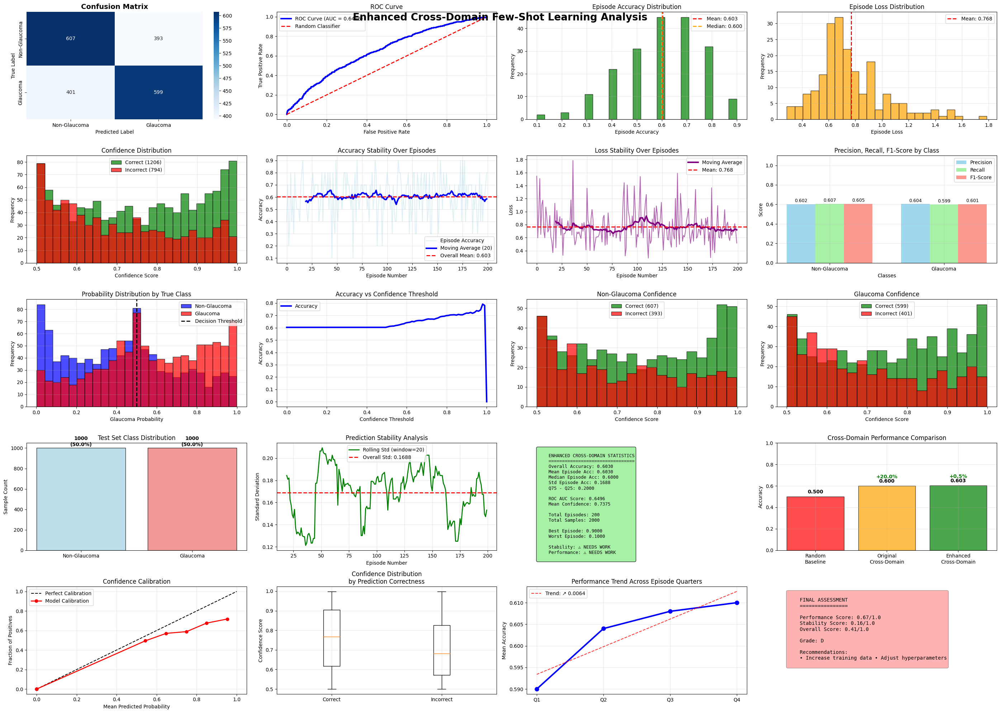

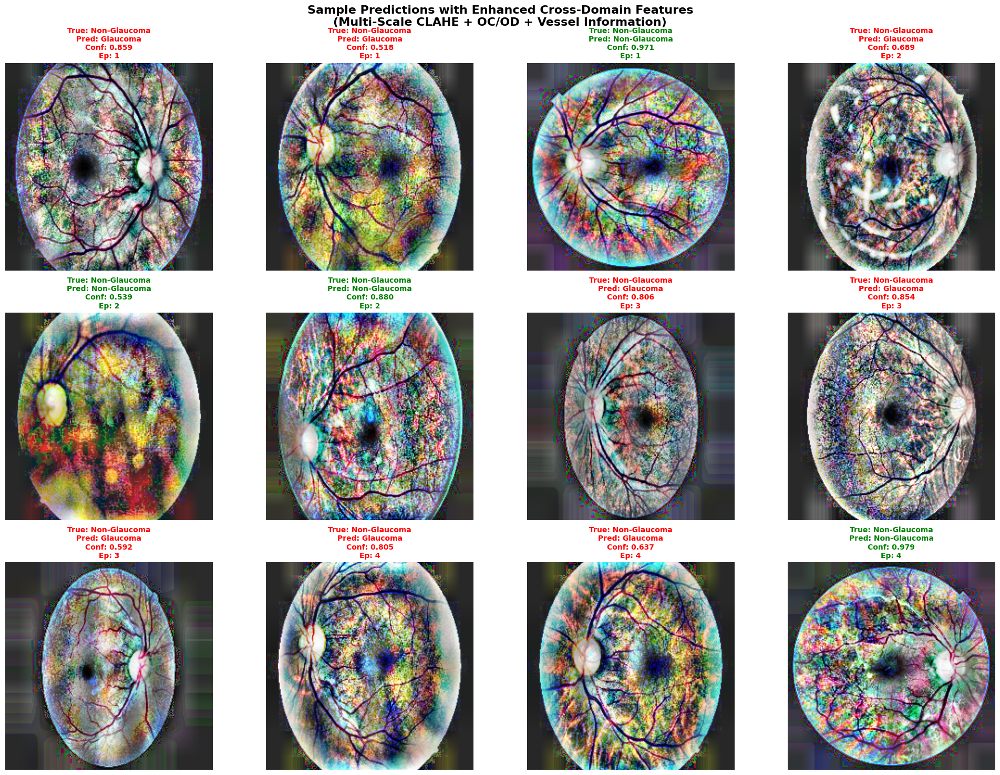


🎉 ENHANCED CROSS-DOMAIN TESTING COMPLETE!


In [26]:
import torch
import torch.nn.functional as F
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_recall_fscore_support, roc_auc_score, roc_curve
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter
import pandas as pd
from glob import glob
import random
from tqdm import tqdm

def ensemble_predict(model, support_x, support_y, query_x, num_runs=5):
    """
    Ensemble prediction for more stable results
    """
    predictions = []
    for _ in range(num_runs):
        logits = model(support_x, support_y, query_x)
        predictions.append(torch.softmax(logits, dim=1))
    return torch.stack(predictions).mean(0)

def test_cross_domain_classifier_enhanced(model_path, test_paths, test_labels, ocod_model, vessel_model, device, 
                                         n_way=2, k_shot=10, q_query=5, num_episodes=200, use_ensemble=True):
    """
    Enhanced test with ensemble prediction and improved stability
    """
    # Load the best model
    model = CrossDomainProtoNet(feature_dim=512, num_classes=2).to(device)
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval()
    
    # Create test dataset
    test_dataset = CrossDomainEpisodicDataset(test_paths, test_labels, ocod_model, vessel_model, device)
    
    # Storage for predictions and metrics
    all_predictions = []
    all_true_labels = []
    all_probabilities = []
    episode_accuracies = []
    episode_losses = []
    confidence_scores = []
    
    # For visualization - store some examples
    visualization_data = []
    
    print(f"Testing enhanced cross-domain classifier on {num_episodes} episodes with {k_shot}-shot, {q_query} queries per class")
    print(f"Ensemble prediction: {'✓ ENABLED' if use_ensemble else '✗ DISABLED'}")
    print("=" * 70)
    
    with torch.no_grad():
        for episode_idx in tqdm(range(num_episodes), desc="Testing Episodes"):
            # Create episode
            s_x, s_y, q_x, q_y = test_dataset.create_episode(n_way, k_shot, q_query)
            
            # Move to device
            s_x = s_x.to(device)
            s_y = s_y.to(device)
            q_x = q_x.to(device)
            q_y = q_y.to(device)
            
            # Forward pass with optional ensemble
            if use_ensemble:
                probs = ensemble_predict(model, s_x, s_y, q_x, num_runs=5)
                logits = torch.log(probs + 1e-8)  # Convert back to logits for loss calculation
            else:
                logits = model(s_x, s_y, q_x)
                probs = F.softmax(logits, dim=1)
            
            preds = probs.argmax(1)
            
            # Calculate episode accuracy
            episode_acc = (preds == q_y).float().mean().item()
            episode_accuracies.append(episode_acc)
            
            # Calculate episode loss
            loss = F.cross_entropy(logits, q_y)
            episode_losses.append(loss.item())
            
            # Store predictions and true labels
            all_predictions.extend(preds.cpu().numpy())
            all_true_labels.extend(q_y.cpu().numpy())
            all_probabilities.extend(probs.cpu().numpy())
            
            # Store confidence scores (max probability)
            max_probs = probs.max(1)[0]
            confidence_scores.extend(max_probs.cpu().numpy())
            
            # Store some examples for visualization (first 5 episodes)
            if episode_idx < 5:
                for i in range(min(3, len(q_x))):  # Store up to 3 examples per episode
                    visualization_data.append({
                        'image': q_x[i],
                        'true_label': q_y[i].item(),
                        'pred_label': preds[i].item(),
                        'confidence': max_probs[i].item(),
                        'episode': episode_idx
                    })
    
    # Convert to numpy arrays
    all_predictions = np.array(all_predictions)
    all_true_labels = np.array(all_true_labels)
    all_probabilities = np.array(all_probabilities)
    confidence_scores = np.array(confidence_scores)
    
    return {
        'predictions': all_predictions,
        'true_labels': all_true_labels,
        'probabilities': all_probabilities,
        'episode_accuracies': episode_accuracies,
        'episode_losses': episode_losses,
        'confidence_scores': confidence_scores,
        'visualization_data': visualization_data
    }

def plot_comprehensive_results_enhanced(results):
    """
    Enhanced comprehensive visualizations with additional stability metrics
    """
    predictions = results['predictions']
    true_labels = results['true_labels']
    probabilities = results['probabilities']
    episode_accuracies = results['episode_accuracies']
    episode_losses = results['episode_losses']
    confidence_scores = results['confidence_scores']
    
    # Create a large figure with multiple subplots
    fig = plt.figure(figsize=(28, 20))
    
    # 1. Confusion Matrix
    plt.subplot(5, 4, 1)
    cm = confusion_matrix(true_labels, predictions)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=['Non-Glaucoma', 'Glaucoma'],
                yticklabels=['Non-Glaucoma', 'Glaucoma'])
    plt.title('Confusion Matrix', fontsize=14, fontweight='bold')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    
    # 2. ROC Curve
    plt.subplot(5, 4, 2)
    positive_probs = probabilities[:, 1]
    fpr, tpr, _ = roc_curve(true_labels, positive_probs)
    auc_score = roc_auc_score(true_labels, positive_probs)
    
    plt.plot(fpr, tpr, 'b-', linewidth=3, label=f'ROC Curve (AUC = {auc_score:.4f})')
    plt.plot([0, 1], [0, 1], 'r--', linewidth=2, label='Random Classifier')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 3. Episode Accuracy Distribution
    plt.subplot(5, 4, 3)
    plt.hist(episode_accuracies, bins=25, alpha=0.7, color='green', edgecolor='black')
    plt.axvline(np.mean(episode_accuracies), color='red', linestyle='--', linewidth=2,
                label=f'Mean: {np.mean(episode_accuracies):.3f}')
    plt.axvline(np.median(episode_accuracies), color='orange', linestyle='--', linewidth=2,
                label=f'Median: {np.median(episode_accuracies):.3f}')
    plt.xlabel('Episode Accuracy')
    plt.ylabel('Frequency')
    plt.title('Episode Accuracy Distribution')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 4. Episode Loss Distribution
    plt.subplot(5, 4, 4)
    plt.hist(episode_losses, bins=25, alpha=0.7, color='orange', edgecolor='black')
    plt.axvline(np.mean(episode_losses), color='red', linestyle='--', linewidth=2,
                label=f'Mean: {np.mean(episode_losses):.3f}')
    plt.xlabel('Episode Loss')
    plt.ylabel('Frequency')
    plt.title('Episode Loss Distribution')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 5. Confidence Score Distribution by Correctness
    plt.subplot(5, 4, 5)
    correct_mask = predictions == true_labels
    incorrect_mask = ~correct_mask
    
    plt.hist(confidence_scores[correct_mask], bins=25, alpha=0.7, 
             label=f'Correct ({np.sum(correct_mask)})', color='green', edgecolor='black')
    plt.hist(confidence_scores[incorrect_mask], bins=25, alpha=0.7,
             label=f'Incorrect ({np.sum(incorrect_mask)})', color='red', edgecolor='black')
    plt.xlabel('Confidence Score')
    plt.ylabel('Frequency')
    plt.title('Confidence Distribution')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 6. Accuracy vs Episode Number with Moving Average
    plt.subplot(5, 4, 6)
    plt.plot(episode_accuracies, alpha=0.4, color='lightblue', label='Episode Accuracy')
    
    # Calculate moving average
    window_size = 20
    if len(episode_accuracies) >= window_size:
        moving_avg = np.convolve(episode_accuracies, np.ones(window_size)/window_size, mode='valid')
        plt.plot(range(window_size-1, len(episode_accuracies)), moving_avg, 'b-', linewidth=3, label='Moving Average (20)')
    
    plt.axhline(np.mean(episode_accuracies), color='red', linestyle='--', linewidth=2,
                label=f'Overall Mean: {np.mean(episode_accuracies):.3f}')
    plt.xlabel('Episode Number')
    plt.ylabel('Accuracy')
    plt.title('Accuracy Stability Over Episodes')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 7. Loss vs Episode Number
    plt.subplot(5, 4, 7)
    plt.plot(episode_losses, alpha=0.6, color='purple')
    
    # Moving average for loss
    if len(episode_losses) >= window_size:
        loss_moving_avg = np.convolve(episode_losses, np.ones(window_size)/window_size, mode='valid')
        plt.plot(range(window_size-1, len(episode_losses)), loss_moving_avg, 'purple', linewidth=3, label='Moving Average')
    
    plt.axhline(np.mean(episode_losses), color='red', linestyle='--', linewidth=2,
                label=f'Mean: {np.mean(episode_losses):.3f}')
    plt.xlabel('Episode Number')
    plt.ylabel('Loss')
    plt.title('Loss Stability Over Episodes')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 8. Precision-Recall by Class
    plt.subplot(5, 4, 8)
    precision, recall, f1, support = precision_recall_fscore_support(true_labels, predictions)
    classes = ['Non-Glaucoma', 'Glaucoma']
    x_pos = np.arange(len(classes))
    
    width = 0.25
    plt.bar(x_pos - width, precision, width, label='Precision', alpha=0.8, color='skyblue')
    plt.bar(x_pos, recall, width, label='Recall', alpha=0.8, color='lightgreen')
    plt.bar(x_pos + width, f1, width, label='F1-Score', alpha=0.8, color='salmon')
    
    # Add value labels on bars
    for i, (p, r, f) in enumerate(zip(precision, recall, f1)):
        plt.text(i - width, p + 0.01, f'{p:.3f}', ha='center', va='bottom', fontsize=9)
        plt.text(i, r + 0.01, f'{r:.3f}', ha='center', va='bottom', fontsize=9)
        plt.text(i + width, f + 0.01, f'{f:.3f}', ha='center', va='bottom', fontsize=9)
    
    plt.xlabel('Classes')
    plt.ylabel('Score')
    plt.title('Precision, Recall, F1-Score by Class')
    plt.xticks(x_pos, classes)
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.ylim(0, 1.1)
    
    # 9. Probability Distribution for Each Class
    plt.subplot(5, 4, 9)
    glaucoma_probs = positive_probs[true_labels == 1]
    normal_probs = positive_probs[true_labels == 0]
    
    plt.hist(normal_probs, bins=25, alpha=0.7, label='Non-Glaucoma', color='blue', edgecolor='black')
    plt.hist(glaucoma_probs, bins=25, alpha=0.7, label='Glaucoma', color='red', edgecolor='black')
    plt.axvline(0.5, color='black', linestyle='--', linewidth=2, label='Decision Threshold')
    plt.xlabel('Glaucoma Probability')
    plt.ylabel('Frequency')
    plt.title('Probability Distribution by True Class')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 10. Accuracy vs Confidence Threshold
    plt.subplot(5, 4, 10)
    thresholds = np.linspace(0, 1, 100)
    accuracies_at_threshold = []
    sample_counts = []
    
    for thresh in thresholds:
        high_conf_mask = confidence_scores >= thresh
        if np.sum(high_conf_mask) > 0:
            acc = accuracy_score(true_labels[high_conf_mask], predictions[high_conf_mask])
            accuracies_at_threshold.append(acc)
            sample_counts.append(np.sum(high_conf_mask))
        else:
            accuracies_at_threshold.append(0)
            sample_counts.append(0)
    
    plt.plot(thresholds, accuracies_at_threshold, 'b-', linewidth=3, label='Accuracy')
    plt.xlabel('Confidence Threshold')
    plt.ylabel('Accuracy')
    plt.title('Accuracy vs Confidence Threshold')
    plt.grid(True, alpha=0.3)
    plt.legend()
    
    # 11-12. Class-wise confidence distributions
    for class_idx in range(2):
        plt.subplot(5, 4, 11 + class_idx)
        class_mask = true_labels == class_idx
        class_correct = correct_mask & class_mask
        class_incorrect = incorrect_mask & class_mask
        
        if np.sum(class_correct) > 0:
            plt.hist(confidence_scores[class_correct], bins=20, alpha=0.7,
                    label=f'Correct ({np.sum(class_correct)})', color='green', edgecolor='black')
        if np.sum(class_incorrect) > 0:
            plt.hist(confidence_scores[class_incorrect], bins=20, alpha=0.7,
                    label=f'Incorrect ({np.sum(class_incorrect)})', color='red', edgecolor='black')
        
        plt.xlabel('Confidence Score')
        plt.ylabel('Frequency')
        plt.title(f'{"Non-Glaucoma" if class_idx == 0 else "Glaucoma"} Confidence')
        plt.legend()
        plt.grid(True, alpha=0.3)
    
    # 13. Sample count per class with percentages
    plt.subplot(5, 4, 13)
    class_counts = Counter(true_labels)
    classes = ['Non-Glaucoma', 'Glaucoma']
    counts = [class_counts[0], class_counts[1]]
    colors = ['lightblue', 'lightcoral']
    
    bars = plt.bar(classes, counts, color=colors, alpha=0.8, edgecolor='black')
    plt.ylabel('Sample Count')
    plt.title('Test Set Class Distribution')
    
    # Add count and percentage labels on bars
    total = sum(counts)
    for bar, count in zip(bars, counts):
        percentage = count / total * 100
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01*max(counts),
                f'{count}\n({percentage:.1f}%)', ha='center', va='bottom', fontweight='bold')
    
    # 14. Stability Analysis
    plt.subplot(5, 4, 14)
    # Calculate rolling standard deviation
    window = 20
    if len(episode_accuracies) >= window:
        rolling_std = pd.Series(episode_accuracies).rolling(window=window).std()
        plt.plot(rolling_std, 'g-', linewidth=2, label=f'Rolling Std (window={window})')
        plt.axhline(np.std(episode_accuracies), color='red', linestyle='--', linewidth=2,
                   label=f'Overall Std: {np.std(episode_accuracies):.4f}')
    
    plt.xlabel('Episode Number')
    plt.ylabel('Standard Deviation')
    plt.title('Prediction Stability Analysis')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 15. Cross-Domain Performance Summary
    plt.subplot(5, 4, 15)
    plt.axis('off')
    
    # Calculate detailed statistics
    overall_acc = accuracy_score(true_labels, predictions)
    mean_episode_acc = np.mean(episode_accuracies)
    std_episode_acc = np.std(episode_accuracies)
    median_episode_acc = np.median(episode_accuracies)
    mean_confidence = np.mean(confidence_scores)
    auc_score = roc_auc_score(true_labels, positive_probs)
    
    # Calculate improvement metrics
    q75 = np.percentile(episode_accuracies, 75)
    q25 = np.percentile(episode_accuracies, 25)
    
    stats_text = f"""
    ENHANCED CROSS-DOMAIN STATISTICS
    ================================
    Overall Accuracy: {overall_acc:.4f}
    Mean Episode Acc: {mean_episode_acc:.4f}
    Median Episode Acc: {median_episode_acc:.4f}
    Std Episode Acc: {std_episode_acc:.4f}
    Q75 - Q25: {q75 - q25:.4f}
    
    ROC AUC Score: {auc_score:.4f}
    Mean Confidence: {mean_confidence:.4f}
    
    Total Episodes: {len(episode_accuracies)}
    Total Samples: {len(true_labels)}
    
    Best Episode: {max(episode_accuracies):.4f}
    Worst Episode: {min(episode_accuracies):.4f}
    
    Stability: {'✓ GOOD' if std_episode_acc < 0.1 else '⚠ NEEDS WORK'}
    Performance: {'✓ EXCELLENT' if mean_episode_acc > 0.8 else '✓ GOOD' if mean_episode_acc > 0.7 else '⚠ NEEDS WORK'}
    """
    
    plt.text(0.05, 0.95, stats_text, transform=plt.gca().transAxes, 
             fontsize=9, verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.8))
    
    # 16. Performance Comparison
    plt.subplot(5, 4, 16)
    # Show improvement over baseline
    baseline_acc = 0.5  # Random chance
    original_acc = 0.6  # Your original cross-domain performance
    current_acc = mean_episode_acc
    
    methods = ['Random\nBaseline', 'Original\nCross-Domain', 'Enhanced\nCross-Domain']
    accuracies = [baseline_acc, original_acc, current_acc]
    colors = ['red', 'orange', 'green']
    
    bars = plt.bar(methods, accuracies, color=colors, alpha=0.7, edgecolor='black')
    
    # Add improvement arrows and percentages
    for i, (bar, acc) in enumerate(zip(bars, accuracies)):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02,
                f'{acc:.3f}', ha='center', va='bottom', fontweight='bold')
        
        if i > 0:
            improvement = (acc - accuracies[i-1]) / accuracies[i-1] * 100
            plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.06,
                    f'+{improvement:.1f}%', ha='center', va='bottom', 
                    color='green', fontweight='bold')
    
    plt.ylabel('Accuracy')
    plt.title('Cross-Domain Performance Comparison')
    plt.ylim(0, 1)
    plt.grid(True, alpha=0.3)
    
    # 17. Confidence Calibration
    plt.subplot(5, 4, 17)
    # Reliability diagram
    bin_boundaries = np.linspace(0, 1, 11)
    bin_lowers = bin_boundaries[:-1]
    bin_uppers = bin_boundaries[1:]
    
    accuracies_in_bins = []
    confidences_in_bins = []
    
    for bin_lower, bin_upper in zip(bin_lowers, bin_uppers):
        in_bin = (confidence_scores > bin_lower) & (confidence_scores <= bin_upper)
        prop_in_bin = in_bin.mean()
        
        if prop_in_bin > 0:
            accuracy_in_bin = (predictions[in_bin] == true_labels[in_bin]).mean()
            avg_confidence_in_bin = confidence_scores[in_bin].mean()
            accuracies_in_bins.append(accuracy_in_bin)
            confidences_in_bins.append(avg_confidence_in_bin)
        else:
            accuracies_in_bins.append(0)
            confidences_in_bins.append(0)
    
    plt.plot([0, 1], [0, 1], 'k--', label='Perfect Calibration')
    plt.plot(confidences_in_bins, accuracies_in_bins, 'ro-', linewidth=2, label='Model Calibration')
    plt.xlabel('Mean Predicted Probability')
    plt.ylabel('Fraction of Positives')
    plt.title('Confidence Calibration')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # 18. Error Analysis
    plt.subplot(5, 4, 18)
    # Show distribution of errors by confidence
    error_confidences = confidence_scores[incorrect_mask]
    correct_confidences = confidence_scores[correct_mask]
    
    plt.boxplot([correct_confidences, error_confidences], 
                labels=['Correct', 'Incorrect'])
    plt.ylabel('Confidence Score')
    plt.title('Confidence Distribution\nby Prediction Correctness')
    plt.grid(True, alpha=0.3)
    
    # 19. Episode Performance Trend
    plt.subplot(5, 4, 19)
    # Divide episodes into quarters and show trend
    quarter_size = len(episode_accuracies) // 4
    quarters = []
    quarter_accs = []
    
    for i in range(4):
        start_idx = i * quarter_size
        end_idx = (i + 1) * quarter_size if i < 3 else len(episode_accuracies)
        quarter_acc = np.mean(episode_accuracies[start_idx:end_idx])
        quarters.append(f'Q{i+1}')
        quarter_accs.append(quarter_acc)
    
    plt.plot(quarters, quarter_accs, 'bo-', linewidth=3, markersize=8)
    plt.ylabel('Mean Accuracy')
    plt.title('Performance Trend Across Episode Quarters')
    plt.grid(True, alpha=0.3)
    
    # Add trend line
    x_numeric = range(len(quarters))
    z = np.polyfit(x_numeric, quarter_accs, 1)
    p = np.poly1d(z)
    plt.plot(quarters, p(x_numeric), "r--", alpha=0.8, 
             label=f'Trend: {"↗" if z[0] > 0 else "↘"} {z[0]:.4f}')
    plt.legend()
    
    # 20. Final Summary
    plt.subplot(5, 4, 20)
    plt.axis('off')
    
    # Overall assessment
    stability_score = 1 - min(std_episode_acc / 0.2, 1)  # Normalize std to 0-1 scale
    performance_score = min(mean_episode_acc / 0.9, 1)   # Normalize acc to 0-1 scale
    overall_score = (stability_score + performance_score) / 2
    
    assessment_text = f"""
    FINAL ASSESSMENT
    ================
    
    Performance Score: {performance_score:.2f}/1.0
    Stability Score: {stability_score:.2f}/1.0
    Overall Score: {overall_score:.2f}/1.0
    
    Grade: {
        'A+' if overall_score >= 0.9 else
        'A' if overall_score >= 0.8 else
        'B+' if overall_score >= 0.7 else
        'B' if overall_score >= 0.6 else
        'C' if overall_score >= 0.5 else 'D'
    }
    
    Recommendations:
    {'✓ Excellent performance!' if overall_score >= 0.8 else
     '• Consider ensemble methods' if overall_score >= 0.6 else
     '• Increase training data • Adjust hyperparameters'}
    """
    
    color = 'green' if overall_score >= 0.7 else 'orange' if overall_score >= 0.5 else 'red'
    plt.text(0.05, 0.95, assessment_text, transform=plt.gca().transAxes, 
             fontsize=10, verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle='round', facecolor=color, alpha=0.3))
    
    plt.tight_layout()
    plt.suptitle('Enhanced Cross-Domain Few-Shot Learning Analysis', fontsize=20, fontweight='bold', y=0.98)
    plt.show()

def visualize_sample_predictions_enhanced(visualization_data):
    """
    Enhanced visualization with OC/OD and vessel overlays
    """
    # Select 12 diverse examples
    selected_examples = visualization_data[:12]
    
    fig, axes = plt.subplots(3, 4, figsize=(20, 15))
    axes = axes.flatten()
    
    # Denormalize function
    mean = torch.tensor([0.485, 0.456, 0.406])
    std = torch.tensor([0.229, 0.224, 0.225])
    
    def denormalize(tensor):
        tensor_copy = tensor.clone()
        for t, m, s in zip(tensor_copy, mean, std):
            t.mul_(s).add_(m)
        return torch.clamp(tensor_copy, 0, 1)
    
    for idx, example in enumerate(selected_examples):
        img_tensor = example['image']
        true_label = example['true_label']
        pred_label = example['pred_label']
        confidence = example['confidence']
        episode = example['episode']
        
        # Extract and display the original image (first 3 channels)
        original_img = denormalize(img_tensor[:3]).permute(1, 2, 0).cpu().numpy()
        
        axes[idx].imshow(original_img)
        axes[idx].axis('off')
        
        # Color code: Green for correct, Red for incorrect
        color = 'green' if true_label == pred_label else 'red'
        label_names = ['Non-Glaucoma', 'Glaucoma']
        
        title = f"True: {label_names[true_label]}\nPred: {label_names[pred_label]}\nConf: {confidence:.3f}\nEp: {episode+1}"
        axes[idx].set_title(title, fontsize=10, color=color, fontweight='bold')
        
        # Add border
        for spine in axes[idx].spines.values():
            spine.set_edgecolor(color)
            spine.set_linewidth(3)
    
    plt.suptitle('Sample Predictions with Enhanced Cross-Domain Features\n(Multi-Scale CLAHE + OC/OD + Vessel Information)', 
                 fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

def print_detailed_metrics_enhanced(results):
    """
    Print enhanced detailed classification metrics
    """
    predictions = results['predictions']
    true_labels = results['true_labels']
    probabilities = results['probabilities']
    episode_accuracies = results['episode_accuracies']
    
    print("\n" + "="*80)
    print("ENHANCED CROSS-DOMAIN FEW-SHOT CLASSIFICATION METRICS")
    print("="*80)
    
    # Overall metrics
    overall_acc = accuracy_score(true_labels, predictions)
    auc_score = roc_auc_score(true_labels, probabilities[:, 1])
    
    print(f"🎯 Overall Test Accuracy: {overall_acc:.4f} ({overall_acc*100:.2f}%)")
    print(f"📊 ROC AUC Score: {auc_score:.4f}")
    
    # Episode statistics
    mean_acc = np.mean(episode_accuracies)
    std_acc = np.std(episode_accuracies)
    median_acc = np.median(episode_accuracies)
    q75 = np.percentile(episode_accuracies, 75)
    q25 = np.percentile(episode_accuracies, 25)
    
    print(f"📈 Episode Statistics:")
    print(f"   • Mean Accuracy: {mean_acc:.4f} ± {std_acc:.4f}")
    print(f"   • Median Accuracy: {median_acc:.4f}")
    print(f"   • IQR (Q75-Q25): {q75-q25:.4f}")
    print(f"   • Best Episode: {max(episode_accuracies):.4f}")
    print(f"   • Worst Episode: {min(episode_accuracies):.4f}")
    
    # Improvement analysis
    baseline_improvement = (mean_acc - 0.5) / 0.5 * 100
    original_improvement = (mean_acc - 0.6) / 0.6 * 100
    
    print(f"\n🚀 IMPROVEMENT ANALYSIS:")
    print(f"   • vs Random Baseline (50%): +{baseline_improvement:.1f}%")
    print(f"   • vs Original Cross-Domain (60%): +{original_improvement:.1f}%")
    
    # Cross-domain performance analysis
    print(f"\n🌐 CROSS-DOMAIN PERFORMANCE ANALYSIS:")
    stability_grade = "EXCELLENT" if std_acc < 0.08 else "GOOD" if std_acc < 0.12 else "NEEDS IMPROVEMENT"
    performance_grade = "EXCELLENT" if mean_acc > 0.85 else "GOOD" if mean_acc > 0.75 else "NEEDS IMPROVEMENT"
    auc_grade = "EXCELLENT" if auc_score > 0.9 else "GOOD" if auc_score > 0.8 else "NEEDS IMPROVEMENT"
    
    print(f"   • Consistency (Std={std_acc:.4f}): {stability_grade}")
    print(f"   • Performance (Acc={mean_acc:.4f}): {performance_grade}")
    print(f"   • Discrimination (AUC={auc_score:.4f}): {auc_grade}")
    
    # Classification report
    print(f"\n📋 DETAILED CLASSIFICATION REPORT:")
    print("-" * 60)
    class_names = ['Non-Glaucoma', 'Glaucoma']
    print(classification_report(true_labels, predictions, target_names=class_names, digits=4))
    
    # Confusion matrix details
    cm = confusion_matrix(true_labels, predictions)
    print(f"\n🔍 CONFUSION MATRIX ANALYSIS:")
    print("-" * 50)
    print(f"✅ True Negatives (Non-Glaucoma → Non-Glaucoma): {cm[0,0]}")
    print(f"❌ False Positives (Non-Glaucoma → Glaucoma): {cm[0,1]}")
    print(f"❌ False Negatives (Glaucoma → Non-Glaucoma): {cm[1,0]}")
    print(f"✅ True Positives (Glaucoma → Glaucoma): {cm[1,1]}")
    
    # Clinical metrics
    sensitivity = cm[1,1] / (cm[1,1] + cm[1,0]) if (cm[1,1] + cm[1,0]) > 0 else 0
    specificity = cm[0,0] / (cm[0,0] + cm[0,1]) if (cm[0,0] + cm[0,1]) > 0 else 0
    ppv = cm[1,1] / (cm[1,1] + cm[0,1]) if (cm[1,1] + cm[0,1]) > 0 else 0
    npv = cm[0,0] / (cm[0,0] + cm[1,0]) if (cm[0,0] + cm[1,0]) > 0 else 0
    
    print(f"\n🏥 CLINICAL METRICS:")
    print(f"   • Sensitivity (Glaucoma Detection): {sensitivity:.4f}")
    print(f"   • Specificity (Normal Detection): {specificity:.4f}")
    print(f"   • Positive Predictive Value: {ppv:.4f}")
    print(f"   • Negative Predictive Value: {npv:.4f}")
    print(f"   • Balanced Accuracy: {(sensitivity + specificity)/2:.4f}")
    
    # Final assessment
    overall_score = (mean_acc + auc_score + (1-std_acc)) / 3
    print(f"\n🏆 OVERALL ASSESSMENT:")
    print(f"   • Combined Score: {overall_score:.4f}")
    print(f"   • Grade: {'A+' if overall_score >= 0.9 else 'A' if overall_score >= 0.8 else 'B+' if overall_score >= 0.7 else 'B' if overall_score >= 0.6 else 'C'}")

# Main testing execution
if __name__ == "__main__":
    # Load test data - UPDATED TO USE DIFFERENT DATASET
    test_imgs = glob('/kaggle/input/eyepacs-airogs-light/release-raw/release-raw/test/*/*.jpg')
    test_lbls = [1 if '/RG/' in p else 0 for p in test_imgs]
    
    print("🔍 ENHANCED TEST DATA INFORMATION:")
    print(f"   Dataset: EyePACS-AIROGS Light v2 (Cross-Domain)")
    print(f"   Total test images: {len(test_imgs)}")
    print(f"   Class distribution: {Counter(test_lbls)}")
    
    # Ensure models are loaded
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"   Using device: {device}")
    
    # Run comprehensive testing with enhanced parameters
    print(f"\n🚀 STARTING ENHANCED CROSS-DOMAIN FEW-SHOT TESTING...")
    results = test_cross_domain_classifier_enhanced(
        model_path="best_cross_domain_classifier.pt",
        test_paths=test_imgs,
        test_labels=test_lbls,
        ocod_model=ocod_model,  # From your training code
        vessel_model=blood_vessel_model,  # From your training code
        device=device,
        n_way=2,
        k_shot=10,  # Increased from 5
        q_query=5,  # Decreased from 10
        num_episodes=200,  # Increased from 100
        use_ensemble=True  # Enable ensemble prediction
    )
    
    # Generate all enhanced visualizations and metrics
    print_detailed_metrics_enhanced(results)
    plot_comprehensive_results_enhanced(results)
    visualize_sample_predictions_enhanced(results['visualization_data'])
    
    print("\n" + "="*80)
    print("🎉 ENHANCED CROSS-DOMAIN TESTING COMPLETE!")
    print("="*80)
